COMPLETE CRISIS HARMONIZATION ANALYSIS FRAMEWORK
Integrating NLP, Transformers, HMM, and Statistical Analysis
WITHOUT circular logic or training bias

1. Setting up NLP models...


Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu



2. Processing mobility data...
DATA SUMMARY
NORMAL PERIOD:
  Total days: 61
  Total sentences: 2077
  Average visits per day: 34.0

EMERGENCY PERIOD:
  Total days: 14
  Total sentences: 424
  Average visits per day: 30.3

VENUE DIVERSITY:
  Normal unique venues: 7
  Emergency unique venues: 7

TIME COVERAGE:
  Normal hours range: 1 - 23
  Emergency hours range: 1 - 23

3. Running HMM analysis...

HIDDEN MARKOV MODEL ANALYSIS
Model Performance:
  Normal period score: -0.6763
  Emergency period score: -0.7603
  Score difference: -0.0840

Transition Matrix Analysis:
  Average transition change: 0.2257
  Maximum transition change: 0.7323

✅ SIGNIFICANT BEHAVIORAL STATE CHANGES
   Crisis substantially alters mobility patterns

4. Running crisis harmonization analysis...

BEHAVIORAL CONVERGENCE ANALYSIS
Shannon Entropy Reduction (Higher = More Convergence):
  Venue Convergence: -0.180 bits
  Temporal Convergence: +0.068 bits
  Spatial Convergence: +0.098 bits
  Hourly Convergence: +0.065 bi

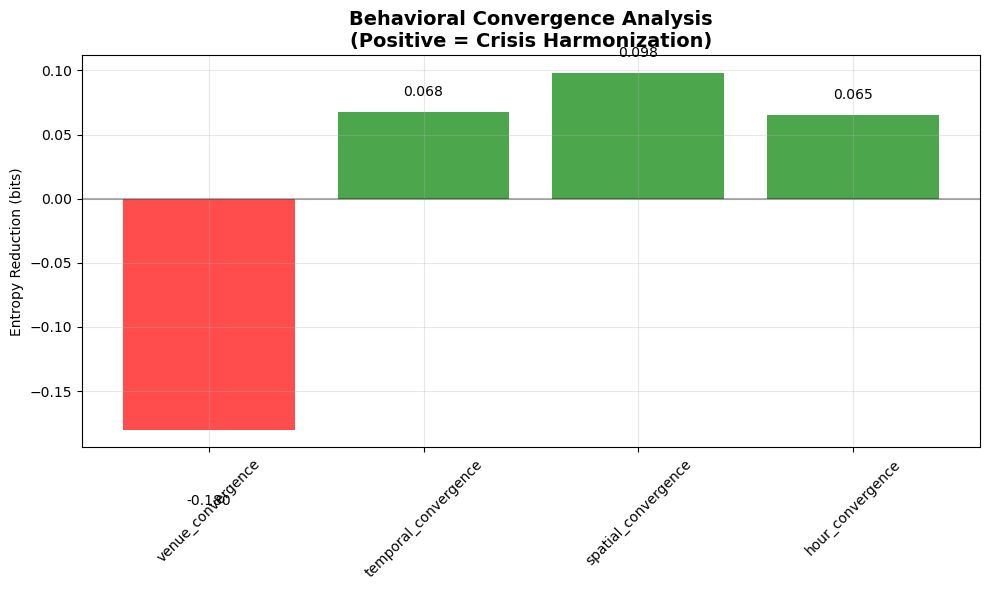

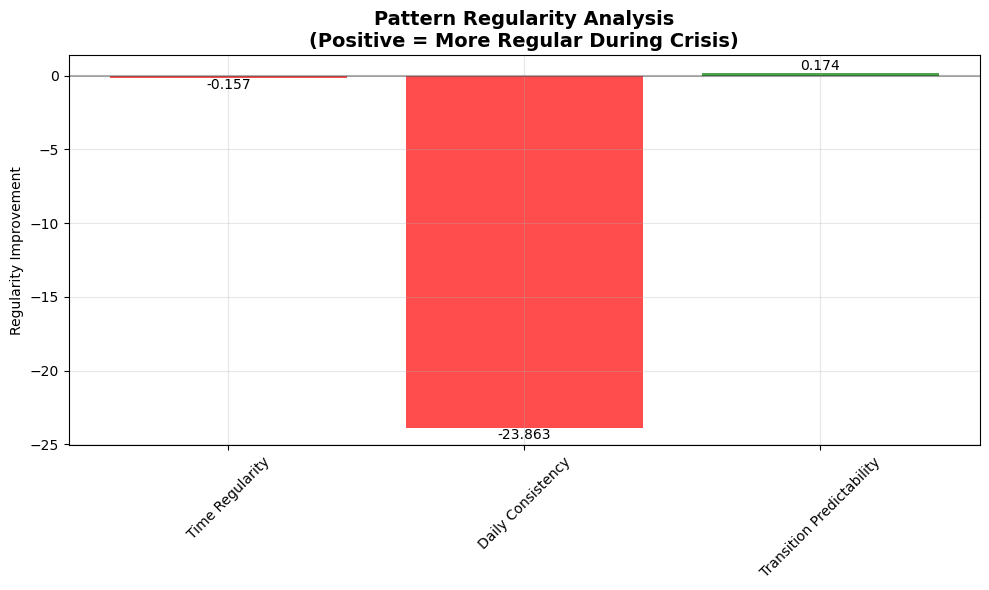

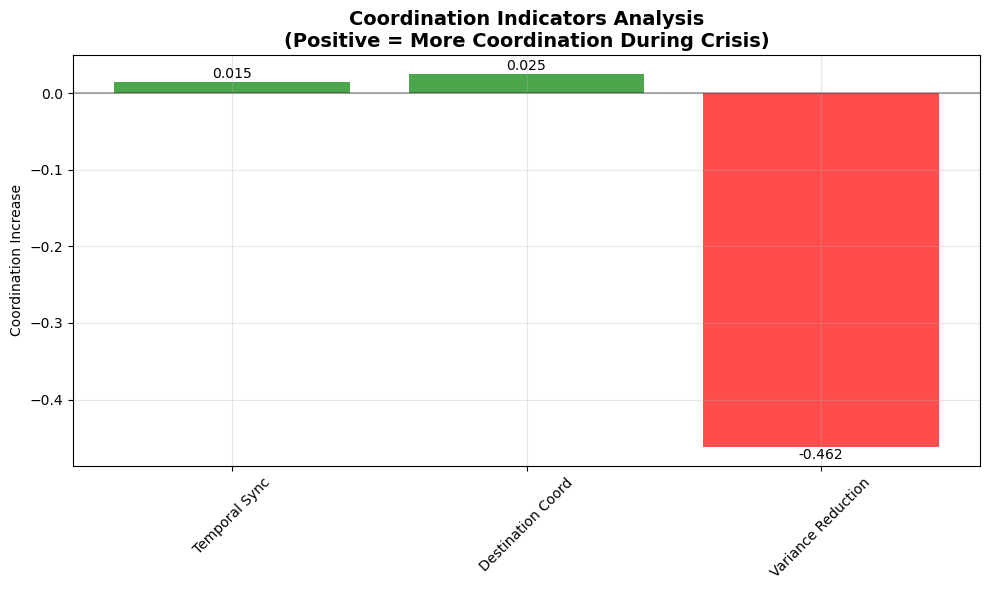

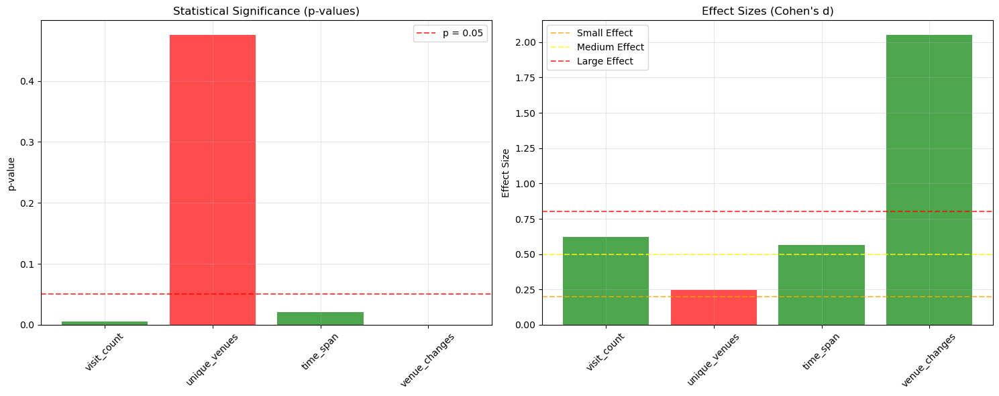

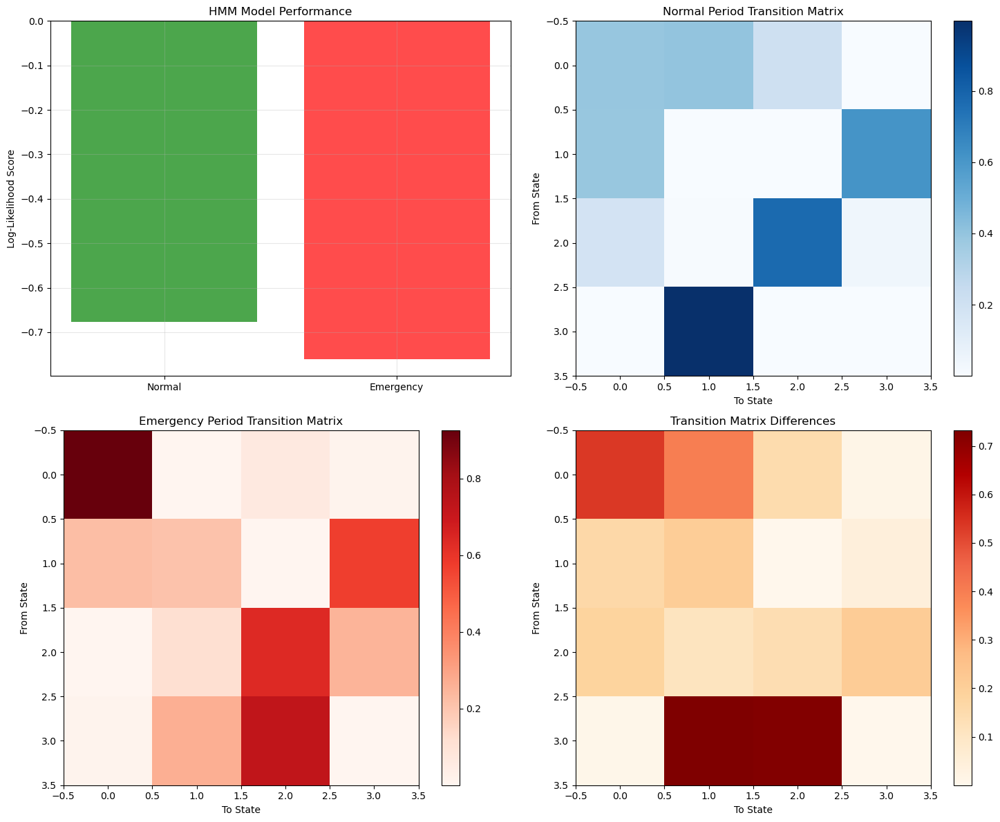

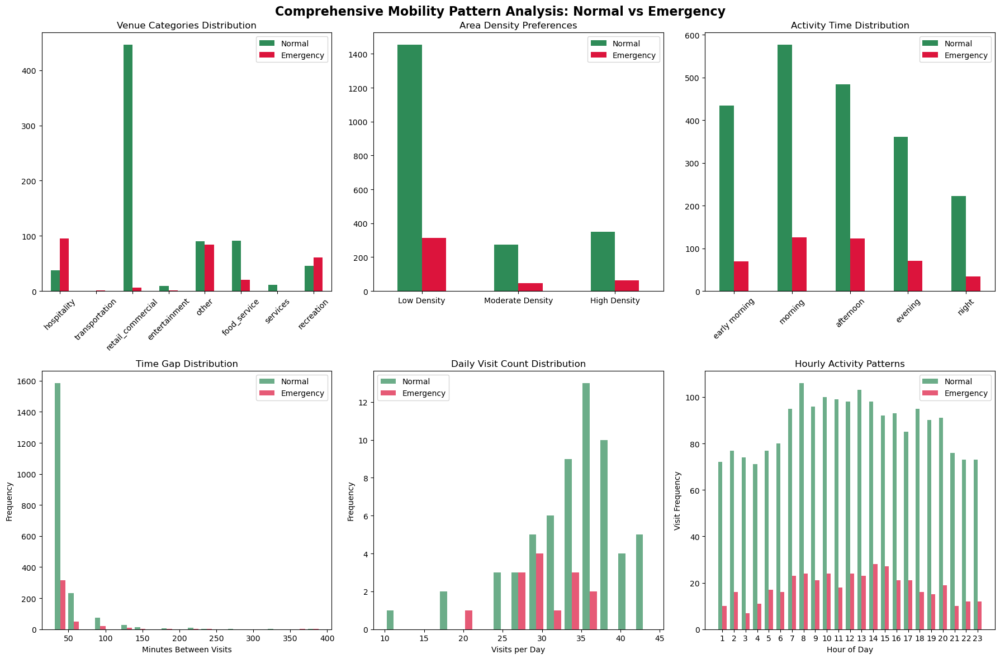


ANALYSIS COMPLETE!
Results dictionary contains:
  - Processed data with NLP features
  - HMM models and scores
  - Convergence, regularity, and coordination metrics
  - Statistical significance tests
  - All visualizations displayed


In [3]:
#!/usr/bin/env python
"""
Complete Crisis Harmonization Analysis Framework
Integrates NLP, Transformers, HMM, and Statistical Analysis
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
from collections import defaultdict, Counter
from datetime import datetime
from scipy import stats
from sklearn.preprocessing import StandardScaler, LabelEncoder
import json
import spacy
from textblob import TextBlob
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

warnings.filterwarnings('ignore')

# ===============================================================================
# 1. DATA LOADING AND PREPROCESSING
# ===============================================================================

def load_mobility_file(file_path):
    """Load mobility narrative file with encoding handling"""
    with open(file_path, 'r', encoding='ISO-8859-1') as f:
        content = f.read()
    return content

def extract_daily_sections(content):
    """Extract daily sections from the file"""
    daily_data = {}
    day_sections = re.split(r'--- DAY_(\d+) ---', content)
    
    for i in range(1, len(day_sections), 2):
        if i + 1 < len(day_sections):
            day_num = int(day_sections[i])
            day_content = day_sections[i + 1]
            sentences = extract_sentences(day_content)
            
            if sentences:
                daily_data[day_num] = {
                    'raw_content': day_content,
                    'sentences': sentences,
                    'total_visits': len(sentences)
                }
    return daily_data

def extract_sentences(day_content):
    """Extract individual sentences from day content"""
    sentences = []
    sentences_section = re.search(r'Individual Sentences:(.*?)(?=Total visits:|$)', 
                                day_content, re.DOTALL)
    
    if sentences_section:
        sentences_text = sentences_section.group(1)
        sentence_matches = re.findall(r'\d+\.\s+(.+?)(?=\n\d+\.|$)', 
                                    sentences_text, re.DOTALL)
        
        for sentence in sentence_matches:
            sentence = sentence.strip()
            if sentence:
                sentences.append(sentence)
    
    return sentences

# ===============================================================================
# 2. RULE-BASED FEATURE EXTRACTION
# ===============================================================================

def extract_time_features(sentence):
    """Extract time-related features"""
    features = {}
    
    time_match = re.search(r'At (\d{1,2}:\d{2})', sentence)
    if time_match:
        features['time'] = time_match.group(1)
        hour, minute = map(int, time_match.group(1).split(':'))
        features['hour'] = hour
        features['minute'] = minute
    
    day_match = re.search(r'on (Monday|Tuesday|Wednesday|Thursday|Friday|Saturday|Sunday)', sentence)
    if day_match:
        features['day_of_week'] = day_match.group(1)
    
    period_match = re.search(r'(early morning|morning|afternoon|evening|night)', sentence)
    if period_match:
        features['time_period'] = period_match.group(1)
    
    return features

def extract_venue_features(sentence):
    """Extract venue-related features"""
    features = {}
    
    venue_match = re.search(r'visited ([^in]+) in', sentence)
    if venue_match:
        venue = venue_match.group(1).strip()
        features['venue_type'] = venue
        features['venue_category'] = categorize_venue(venue)
    
    return features

def extract_spatial_features(sentence):
    """Extract spatial features"""
    features = {}
    
    density_match = re.search(r'(high-density|moderate-density|low-density)', sentence)
    if density_match:
        features['density'] = density_match.group(1)
    
    distance_match = re.search(r'area (inner|central|outer) from city center', sentence)
    if distance_match:
        features['distance_from_center'] = distance_match.group(1)
    
    amenity_match = re.search(r'with (limited|several|diverse) amenities', sentence)
    if amenity_match:
        features['amenity_level'] = amenity_match.group(1)
    
    return features

def categorize_venue(venue_text):
    """Categorize venue based on predefined categories"""
    venue_categories = {
        'food_service': ['restaurant', 'diner', 'food', 'fast food', 'cafe'],
        'entertainment': ['bar', 'wine bar', 'entertainment', 'casino'],
        'retail_commercial': ['store', 'convenience store', 'grocery store', 'shop'],
        'transportation': ['transit station', 'port'],
        'recreation': ['park', 'sports recreation', 'fishing'],
        'services': ['hospital', 'post office', 'school', 'office'],
        'hospitality': ['hotel', 'cafe', 'sweets']
    }
    
    if not venue_text:
        return 'unknown'
    
    venue_lower = venue_text.lower()
    for category, keywords in venue_categories.items():
        for keyword in keywords:
            if keyword in venue_lower:
                return category
    return 'other'

def combine_rule_features(sentence):
    """Combine all rule-based features"""
    features = {}
    features.update(extract_time_features(sentence))
    features.update(extract_venue_features(sentence))
    features.update(extract_spatial_features(sentence))
    features['original_sentence'] = sentence
    return features

# ===============================================================================
# 3. NLP FEATURE EXTRACTION
# ===============================================================================

def setup_spacy_model():
    """Setup spaCy model"""
    nlp = spacy.load("en_core_web_sm")
    return nlp

def extract_spacy_features(sentence, nlp):
    """Extract features using spaCy NER"""
    doc = nlp(sentence)
    
    features = {
        'entities': [],
        'time_entities': [],
        'location_entities': [],
        'organization_entities': []
    }
    
    for ent in doc.ents:
        entity_info = {
            'text': ent.text,
            'label': ent.label_,
            'start': ent.start_char,
            'end': ent.end_char
        }
        features['entities'].append(entity_info)
        
        if ent.label_ in ['TIME', 'DATE']:
            features['time_entities'].append(ent.text)
        elif ent.label_ in ['GPE', 'LOC']:
            features['location_entities'].append(ent.text)
        elif ent.label_ in ['ORG']:
            features['organization_entities'].append(ent.text)
    
    blob = TextBlob(sentence)
    features['sentiment'] = {
        'polarity': blob.sentiment.polarity,
        'subjectivity': blob.sentiment.subjectivity
    }
    
    return features

def setup_transformer_model():
    """Setup transformer NER model"""
    ner_pipeline = pipeline(
        "ner", 
        model="dbmdz/bert-large-cased-finetuned-conll03-english",
        aggregation_strategy="simple"
    )
    return ner_pipeline

def extract_transformer_features(sentence, ner_pipeline):
    """Extract features using transformer NER"""
    entities = ner_pipeline(sentence)
    
    features = {
        'entities': [],
        'person_entities': [],
        'location_entities': [],
        'organization_entities': [],
        'misc_entities': []
    }
    
    for entity in entities:
        entity_info = {
            'text': entity['word'],
            'label': entity['entity_group'],
            'confidence': entity['score'],
            'start': entity['start'],
            'end': entity['end']
        }
        features['entities'].append(entity_info)
        
        label = entity['entity_group']
        if label == 'PER':
            features['person_entities'].append(entity['word'])
        elif label == 'LOC':
            features['location_entities'].append(entity['word'])
        elif label == 'ORG':
            features['organization_entities'].append(entity['word'])
        elif label == 'MISC':
            features['misc_entities'].append(entity['word'])
    
    return features

# ===============================================================================
# 4. COMPREHENSIVE FEATURE EXTRACTION
# ===============================================================================

def extract_comprehensive_features(sentence, nlp, ner_pipeline):
    """Extract features using all methods"""
    features = {
        'sentence': sentence,
        'rule_based': combine_rule_features(sentence),
        'spacy_ner': extract_spacy_features(sentence, nlp),
        'transformer_ner': extract_transformer_features(sentence, ner_pipeline)
    }
    
    features['reconciled'] = reconcile_features(features)
    return features

def reconcile_features(all_features):
    """Reconcile results from different extraction methods"""
    reconciled = {}
    
    rule_results = all_features['rule_based']
    
    structured_fields = ['time', 'hour', 'minute', 'day_of_week', 'time_period', 
                        'venue_type', 'venue_category', 'density', 
                        'distance_from_center', 'amenity_level']
    
    for field in structured_fields:
        if rule_results.get(field):
            reconciled[field] = rule_results[field]
    
    all_entities = []
    if all_features['spacy_ner']['entities']:
        all_entities.extend(all_features['spacy_ner']['entities'])
    if all_features['transformer_ner']['entities']:
        all_entities.extend(all_features['transformer_ner']['entities'])
    
    reconciled['all_entities'] = all_entities
    reconciled['sentiment'] = all_features['spacy_ner'].get('sentiment', {})
    
    return reconciled

def process_mobility_data(file_path, period_type, nlp, ner_pipeline):
    """Process complete mobility file"""
    content = load_mobility_file(file_path)
    daily_data = extract_daily_sections(content)
    
    processed_data = {
        'period_type': period_type,
        'file_path': file_path,
        'total_days': len(daily_data),
        'daily_data': {}
    }
    
    for day_num, day_info in daily_data.items():
        processed_sentences = []
        
        for sentence in day_info['sentences']:
            comprehensive_results = extract_comprehensive_features(sentence, nlp, ner_pipeline)
            processed_sentences.append(comprehensive_results)
        
        processed_data['daily_data'][day_num] = {
            'day_number': day_num,
            'total_visits': len(processed_sentences),
            'sentences': processed_sentences
        }
    
    return processed_data

# ===============================================================================
# 5. SIMPLE HMM IMPLEMENTATION
# ===============================================================================

class SimpleHMM:
    """Simple HMM for mobility pattern analysis"""
    
    def __init__(self, n_states=4):
        self.n_states = n_states
        self.transition_matrix = None
        self.emission_matrix = None
        self.initial_probs = None
        self.observation_vocab = {}
        self.is_fitted = False
    
    def fit(self, sequences, max_iter=50):
        """Fit HMM using simplified EM algorithm"""
        all_obs = []
        for seq in sequences:
            all_obs.extend(seq)
        
        unique_obs = list(set(all_obs))
        self.observation_vocab = {obs: i for i, obs in enumerate(unique_obs)}
        n_obs = len(unique_obs)
        
        self.transition_matrix = np.random.rand(self.n_states, self.n_states)
        self.transition_matrix = self.transition_matrix / self.transition_matrix.sum(axis=1, keepdims=True)
        
        self.emission_matrix = np.random.rand(self.n_states, n_obs)
        self.emission_matrix = self.emission_matrix / self.emission_matrix.sum(axis=1, keepdims=True)
        
        self.initial_probs = np.random.rand(self.n_states)
        self.initial_probs = self.initial_probs / self.initial_probs.sum()
        
        numeric_sequences = []
        for seq in sequences:
            numeric_seq = [self.observation_vocab[obs] for obs in seq if obs in self.observation_vocab]
            if numeric_seq:
                numeric_sequences.append(numeric_seq)
        
        for iteration in range(max_iter):
            all_states = []
            for seq in numeric_sequences:
                if len(seq) > 0:
                    states = self.viterbi(seq)
                    all_states.append(states)
            
            self.update_parameters(numeric_sequences, all_states)
        
        self.is_fitted = True
        return self
    
    def viterbi(self, sequence):
        """Viterbi algorithm for finding most likely state sequence"""
        T = len(sequence)
        if T == 0:
            return []
        
        delta = np.zeros((T, self.n_states))
        psi = np.zeros((T, self.n_states), dtype=int)
        
        obs_idx = sequence[0]
        if obs_idx < self.emission_matrix.shape[1]:
            delta[0] = self.initial_probs * self.emission_matrix[:, obs_idx]
        else:
            delta[0] = self.initial_probs * 0.001
        
        for t in range(1, T):
            obs_idx = sequence[t]
            for j in range(self.n_states):
                if obs_idx < self.emission_matrix.shape[1]:
                    emission_prob = self.emission_matrix[j, obs_idx]
                else:
                    emission_prob = 0.001
                
                trans_probs = delta[t-1] * self.transition_matrix[:, j]
                delta[t, j] = np.max(trans_probs) * emission_prob
                psi[t, j] = np.argmax(trans_probs)
        
        states = np.zeros(T, dtype=int)
        states[T-1] = np.argmax(delta[T-1])
        
        for t in range(T-2, -1, -1):
            states[t] = psi[t+1, states[t+1]]
        
        return states.tolist()
    
    def update_parameters(self, sequences, state_sequences):
        """Update HMM parameters"""
        transition_counts = np.zeros((self.n_states, self.n_states))
        
        for states in state_sequences:
            for t in range(len(states) - 1):
                transition_counts[states[t], states[t+1]] += 1
        
        transition_counts += 0.01
        self.transition_matrix = transition_counts / transition_counts.sum(axis=1, keepdims=True)
        
        emission_counts = np.zeros((self.n_states, len(self.observation_vocab)))
        
        for seq, states in zip(sequences, state_sequences):
            for obs, state in zip(seq, states):
                if obs < emission_counts.shape[1]:
                    emission_counts[state, obs] += 1
        
        emission_counts += 0.01
        self.emission_matrix = emission_counts / emission_counts.sum(axis=1, keepdims=True)
    
    def score(self, sequences):
        """Calculate log-likelihood of sequences"""
        if not self.is_fitted:
            return -np.inf
        
        total_log_prob = 0
        total_length = 0
        
        for seq in sequences:
            numeric_seq = [self.observation_vocab.get(obs, 0) for obs in seq]
            if len(numeric_seq) > 0:
                log_prob = self.forward_probability(numeric_seq)
                total_log_prob += log_prob
                total_length += len(numeric_seq)
        
        return total_log_prob / max(total_length, 1)
    
    def forward_probability(self, sequence):
        """Calculate forward probability"""
        T = len(sequence)
        if T == 0:
            return -np.inf
        
        alpha = np.zeros((T, self.n_states))
        
        obs_idx = min(sequence[0], self.emission_matrix.shape[1] - 1)
        alpha[0] = self.initial_probs * self.emission_matrix[:, obs_idx]
        
        for t in range(1, T):
            obs_idx = min(sequence[t], self.emission_matrix.shape[1] - 1)
            for j in range(self.n_states):
                alpha[t, j] = np.sum(alpha[t-1] * self.transition_matrix[:, j]) * self.emission_matrix[j, obs_idx]
        
        return np.log(np.sum(alpha[T-1]) + 1e-10)

def extract_hmm_sequences(processed_data):
    """Extract observation sequences for HMM"""
    sequences = []
    
    for day_num, day_data in processed_data['daily_data'].items():
        day_sequence = []
        
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            
            venue = reconciled.get('venue_category', 'unknown')
            density = reconciled.get('density', 'unknown')
            time_period = reconciled.get('time_period', 'unknown')
            
            observation = f"{venue}_{density}_{time_period}"
            day_sequence.append(observation)
        
        if len(day_sequence) > 1:
            sequences.append(day_sequence)
    
    return sequences

# ===============================================================================
# 6. CRISIS HARMONIZATION ANALYSIS
# ===============================================================================

def calculate_entropy(data_list):
    """Calculate Shannon entropy"""
    if not data_list:
        return 0
    
    counts = Counter(data_list)
    total = len(data_list)
    entropy = -sum((count/total) * np.log2(count/total) for count in counts.values())
    
    return entropy

def extract_behavior_patterns(data):
    """Extract behavior patterns without bias"""
    patterns = {'venues': [], 'time_periods': [], 'densities': [], 'hours': []}
    
    for day_data in data['daily_data'].values():
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            
            if reconciled.get('venue_category'):
                patterns['venues'].append(reconciled['venue_category'])
            if reconciled.get('time_period'):
                patterns['time_periods'].append(reconciled['time_period'])
            if reconciled.get('density'):
                patterns['densities'].append(reconciled['density'])
            if reconciled.get('hour'):
                patterns['hours'].append(reconciled['hour'])
    
    return patterns

def measure_behavioral_convergence(normal_data, emergency_data):
    """Measure behavioral convergence using entropy"""
    normal_patterns = extract_behavior_patterns(normal_data)
    emergency_patterns = extract_behavior_patterns(emergency_data)
    
    convergence_metrics = {}
    
    normal_venue_entropy = calculate_entropy(normal_patterns['venues'])
    emergency_venue_entropy = calculate_entropy(emergency_patterns['venues'])
    convergence_metrics['venue_convergence'] = normal_venue_entropy - emergency_venue_entropy
    
    normal_time_entropy = calculate_entropy(normal_patterns['time_periods'])
    emergency_time_entropy = calculate_entropy(emergency_patterns['time_periods'])
    convergence_metrics['temporal_convergence'] = normal_time_entropy - emergency_time_entropy
    
    normal_density_entropy = calculate_entropy(normal_patterns['densities'])
    emergency_density_entropy = calculate_entropy(emergency_patterns['densities'])
    convergence_metrics['spatial_convergence'] = normal_density_entropy - emergency_density_entropy
    
    normal_hour_entropy = calculate_entropy(normal_patterns['hours'])
    emergency_hour_entropy = calculate_entropy(emergency_patterns['hours'])
    convergence_metrics['hour_convergence'] = normal_hour_entropy - emergency_hour_entropy
    
    convergence_metrics['overall_convergence'] = np.mean([
        convergence_metrics['venue_convergence'],
        convergence_metrics['temporal_convergence'], 
        convergence_metrics['spatial_convergence'],
        convergence_metrics['hour_convergence']
    ])
    
    return convergence_metrics

def extract_time_gaps(data):
    """Extract time gaps between visits"""
    gaps = []
    
    for day_data in data['daily_data'].values():
        day_times = []
        
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            hour = reconciled.get('hour')
            minute = reconciled.get('minute', 0)
            
            if hour is not None:
                time_minutes = hour * 60 + minute
                day_times.append(time_minutes)
        
        if len(day_times) > 1:
            day_times.sort()
            day_gaps = [day_times[i+1] - day_times[i] for i in range(len(day_times)-1)]
            gaps.extend(day_gaps)
    
    return gaps

def measure_pattern_regularity(normal_data, emergency_data):
    """Measure pattern regularity improvements"""
    normal_gaps = extract_time_gaps(normal_data)
    emergency_gaps = extract_time_gaps(emergency_data)
    
    regularity_metrics = {}
    
    normal_time_cv = np.std(normal_gaps) / np.mean(normal_gaps) if normal_gaps else 0
    emergency_time_cv = np.std(emergency_gaps) / np.mean(emergency_gaps) if emergency_gaps else 0
    regularity_metrics['time_regularity_improvement'] = normal_time_cv - emergency_time_cv
    
    normal_daily_patterns = extract_daily_patterns(normal_data)
    emergency_daily_patterns = extract_daily_patterns(emergency_data)
    
    normal_pattern_variance = np.var([len(day) for day in normal_daily_patterns])
    emergency_pattern_variance = np.var([len(day) for day in emergency_daily_patterns])
    regularity_metrics['daily_consistency_improvement'] = normal_pattern_variance - emergency_pattern_variance
    
    normal_transitions = extract_transitions(normal_data)
    emergency_transitions = extract_transitions(emergency_data)
    
    normal_transition_entropy = calculate_transition_entropy(normal_transitions)
    emergency_transition_entropy = calculate_transition_entropy(emergency_transitions)
    regularity_metrics['transition_predictability_improvement'] = normal_transition_entropy - emergency_transition_entropy
    
    return regularity_metrics

def extract_daily_patterns(data):
    """Extract daily venue patterns"""
    daily_patterns = []
    
    for day_data in data['daily_data'].values():
        day_pattern = []
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            if reconciled.get('venue_category'):
                day_pattern.append(reconciled['venue_category'])
        daily_patterns.append(day_pattern)
    
    return daily_patterns

def extract_transitions(data):
    """Extract venue transitions"""
    transitions = []
    
    for day_data in data['daily_data'].values():
        venues = []
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            if reconciled.get('venue_category'):
                venues.append(reconciled['venue_category'])
        
        for i in range(len(venues) - 1):
            transitions.append((venues[i], venues[i+1]))
    
    return transitions

def calculate_transition_entropy(transitions):
    """Calculate entropy of transition patterns"""
    if not transitions:
        return 0
    
    return calculate_entropy([f"{t[0]}->{t[1]}" for t in transitions])

def measure_time_clustering(data):
    """Measure temporal clustering"""
    all_hours = []
    
    for day_data in data['daily_data'].values():
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            hour = reconciled.get('hour')
            
            if hour is not None:
                all_hours.append(hour)
    
    if not all_hours:
        return 0
    
    hour_counts = Counter(all_hours)
    return max(hour_counts.values()) / len(all_hours) if all_hours else 0

def measure_venue_concentration(data):
    """Measure venue concentration using Gini coefficient"""
    venues = []
    
    for day_data in data['daily_data'].values():
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            if reconciled.get('venue_category'):
                venues.append(reconciled['venue_category'])
    
    if not venues:
        return 0
    
    venue_counts = Counter(venues)
    n = len(venues)
    sorted_venues = sorted(venue_counts.values())
    index = np.arange(1, len(sorted_venues) + 1)
    
    return (2 * np.sum(index * sorted_venues)) / (n * np.sum(sorted_venues)) - (n + 1) / n

def measure_individual_variance(data):
    """Measure variance in individual daily patterns"""
    daily_venue_counts = []
    
    for day_data in data['daily_data'].values():
        venues = []
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            if reconciled.get('venue_category'):
                venues.append(reconciled['venue_category'])
        daily_venue_counts.append(len(set(venues)))
    
    return np.var(daily_venue_counts) if daily_venue_counts else 0

def measure_coordination_indicators(normal_data, emergency_data):
    """Measure coordination indicators"""
    coordination_metrics = {}
    
    normal_time_clustering = measure_time_clustering(normal_data)
    emergency_time_clustering = measure_time_clustering(emergency_data)
    coordination_metrics['temporal_synchronization'] = emergency_time_clustering - normal_time_clustering
    
    normal_venue_concentration = measure_venue_concentration(normal_data)
    emergency_venue_concentration = measure_venue_concentration(emergency_data)
    coordination_metrics['destination_coordination'] = emergency_venue_concentration - normal_venue_concentration
    
    normal_individual_variance = measure_individual_variance(normal_data)
    emergency_individual_variance = measure_individual_variance(emergency_data)
    coordination_metrics['individual_variance_reduction'] = normal_individual_variance - emergency_individual_variance
    
    return coordination_metrics

def extract_daily_metrics(data):
    """Extract daily-level metrics for statistical testing"""
    daily_metrics = []
    
    for day_num, day_data in data['daily_data'].items():
        venues = []
        times = []
        venue_changes = 0
        
        prev_venue = None
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            
            venue = reconciled.get('venue_category')
            if venue:
                venues.append(venue)
                if prev_venue and venue != prev_venue:
                    venue_changes += 1
                prev_venue = venue
            
            hour = reconciled.get('hour')
            minute = reconciled.get('minute', 0)
            if hour is not None:
                times.append(hour * 60 + minute)
        
        time_span = (max(times) - min(times)) / 60 if len(times) > 1 else 0
        
        daily_metrics.append({
            'day': day_num,
            'visit_count': len(day_data['sentences']),
            'unique_venues': len(set(venues)),
            'time_span': time_span,
            'venue_changes': venue_changes
        })
    
    return pd.DataFrame(daily_metrics)

def statistical_significance_testing(normal_data, emergency_data):
    """Test statistical significance of differences"""
    normal_daily = extract_daily_metrics(normal_data)
    emergency_daily = extract_daily_metrics(emergency_data)
    
    significance_results = {}
    metrics_to_test = ['visit_count', 'unique_venues', 'time_span', 'venue_changes']
    
    for metric in metrics_to_test:
        if metric in normal_daily.columns and metric in emergency_daily.columns:
            normal_values = normal_daily[metric].dropna()
            emergency_values = emergency_daily[metric].dropna()
            
            if len(normal_values) > 3 and len(emergency_values) > 3:
                statistic, p_value = stats.mannwhitneyu(
                    normal_values, emergency_values, alternative='two-sided'
                )
                
                pooled_std = np.sqrt(
                    ((len(normal_values) - 1) * np.var(normal_values) + 
                     (len(emergency_values) - 1) * np.var(emergency_values)) / 
                    (len(normal_values) + len(emergency_values) - 2)
                )
                
                cohens_d = (np.mean(normal_values) - np.mean(emergency_values)) / pooled_std if pooled_std > 0 else 0
                
                significance_results[metric] = {
                    'normal_mean': np.mean(normal_values),
                    'emergency_mean': np.mean(emergency_values),
                    'p_value': p_value,
                    'significant': p_value < 0.05,
                    'cohens_d': cohens_d,
                    'effect_size': 'small' if abs(cohens_d) < 0.5 else 'medium' if abs(cohens_d) < 0.8 else 'large'
                }
    
    return significance_results

# ===============================================================================
# 7. VISUALIZATION FUNCTIONS
# ===============================================================================

def plot_convergence_analysis(convergence_metrics):
    """Visualize behavioral convergence"""
    metrics = ['venue_convergence', 'temporal_convergence', 'spatial_convergence', 'hour_convergence']
    values = [convergence_metrics[m] for m in metrics]
    
    plt.figure(figsize=(10, 6))
    colors = ['green' if v > 0 else 'red' for v in values]
    bars = plt.bar(metrics, values, color=colors, alpha=0.7)
    
    plt.title('Behavioral Convergence Analysis\n(Positive = Crisis Harmonization)', fontsize=14, fontweight='bold')
    plt.ylabel('Entropy Reduction (bits)')
    plt.xticks(rotation=45)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    plt.grid(True, alpha=0.3)
    
    for bar, value in zip(bars, values):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01 if height > 0 else height - 0.05,
                f'{value:.3f}', ha='center', va='bottom' if height > 0 else 'top')
    
    plt.tight_layout()
    plt.show()

def plot_regularity_analysis(regularity_metrics):
    """Visualize pattern regularity improvements"""
    metrics = ['time_regularity_improvement', 'daily_consistency_improvement', 'transition_predictability_improvement']
    values = [regularity_metrics[m] for m in metrics]
    labels = ['Time Regularity', 'Daily Consistency', 'Transition Predictability']
    
    plt.figure(figsize=(10, 6))
    colors = ['green' if v > 0 else 'red' for v in values]
    bars = plt.bar(labels, values, color=colors, alpha=0.7)
    
    plt.title('Pattern Regularity Analysis\n(Positive = More Regular During Crisis)', fontsize=14, fontweight='bold')
    plt.ylabel('Regularity Improvement')
    plt.xticks(rotation=45)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    plt.grid(True, alpha=0.3)
    
    for bar, value in zip(bars, values):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.001 if height > 0 else height - 0.001,
                f'{value:.3f}', ha='center', va='bottom' if height > 0 else 'top')
    
    plt.tight_layout()
    plt.show()

def plot_coordination_analysis(coordination_metrics):
    """Visualize coordination indicators"""
    metrics = ['temporal_synchronization', 'destination_coordination', 'individual_variance_reduction']
    values = [coordination_metrics[m] for m in metrics]
    labels = ['Temporal Sync', 'Destination Coord', 'Variance Reduction']
    
    plt.figure(figsize=(10, 6))
    colors = ['green' if v > 0 else 'red' for v in values]
    bars = plt.bar(labels, values, color=colors, alpha=0.7)
    
    plt.title('Coordination Indicators Analysis\n(Positive = More Coordination During Crisis)', fontsize=14, fontweight='bold')
    plt.ylabel('Coordination Increase')
    plt.xticks(rotation=45)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    plt.grid(True, alpha=0.3)
    
    for bar, value in zip(bars, values):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.001 if height > 0 else height - 0.001,
                f'{value:.3f}', ha='center', va='bottom' if height > 0 else 'top')
    
    plt.tight_layout()
    plt.show()

def plot_significance_results(significance_results):
    """Visualize statistical significance results"""
    metrics = list(significance_results.keys())
    p_values = [significance_results[m]['p_value'] for m in metrics]
    effect_sizes = [abs(significance_results[m]['cohens_d']) for m in metrics]
    significant = [significance_results[m]['significant'] for m in metrics]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    colors = ['green' if sig else 'red' for sig in significant]
    bars1 = ax1.bar(metrics, p_values, color=colors, alpha=0.7)
    ax1.axhline(y=0.05, color='red', linestyle='--', alpha=0.7, label='p = 0.05')
    ax1.set_title('Statistical Significance (p-values)')
    ax1.set_ylabel('p-value')
    ax1.set_xticks(range(len(metrics)))
    ax1.set_xticklabels(metrics, rotation=45)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    bars2 = ax2.bar(metrics, effect_sizes, color=colors, alpha=0.7)
    ax2.axhline(y=0.2, color='orange', linestyle='--', alpha=0.7, label='Small Effect')
    ax2.axhline(y=0.5, color='yellow', linestyle='--', alpha=0.7, label='Medium Effect')
    ax2.axhline(y=0.8, color='red', linestyle='--', alpha=0.7, label='Large Effect')
    ax2.set_title('Effect Sizes (Cohen\'s d)')
    ax2.set_ylabel('Effect Size')
    ax2.set_xticks(range(len(metrics)))
    ax2.set_xticklabels(metrics, rotation=45)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def plot_hmm_analysis(normal_model, emergency_model, normal_score, emergency_score):
    """Visualize HMM analysis results"""
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    scores = [normal_score, emergency_score]
    periods = ['Normal', 'Emergency']
    colors = ['green', 'red']
    
    ax1.bar(periods, scores, color=colors, alpha=0.7)
    ax1.set_title('HMM Model Performance')
    ax1.set_ylabel('Log-Likelihood Score')
    ax1.grid(True, alpha=0.3)
    
    im1 = ax2.imshow(normal_model.transition_matrix, cmap='Blues')
    ax2.set_title('Normal Period Transition Matrix')
    ax2.set_xlabel('To State')
    ax2.set_ylabel('From State')
    plt.colorbar(im1, ax=ax2)
    
    im2 = ax3.imshow(emergency_model.transition_matrix, cmap='Reds')
    ax3.set_title('Emergency Period Transition Matrix')
    ax3.set_xlabel('To State')
    ax3.set_ylabel('From State')
    plt.colorbar(im2, ax=ax3)
    
    transition_diff = np.abs(emergency_model.transition_matrix - normal_model.transition_matrix)
    im3 = ax4.imshow(transition_diff, cmap='OrRd')
    ax4.set_title('Transition Matrix Differences')
    ax4.set_xlabel('To State')
    ax4.set_ylabel('From State')
    plt.colorbar(im3, ax=ax4)
    
    plt.tight_layout()
    plt.show()

def plot_comprehensive_comparison(normal_data, emergency_data):
    """Comprehensive visualization of mobility patterns"""
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Comprehensive Mobility Pattern Analysis: Normal vs Emergency', 
                 fontsize=16, fontweight='bold')
    
    normal_patterns = extract_behavior_patterns(normal_data)
    emergency_patterns = extract_behavior_patterns(emergency_data)
    
    normal_venues = Counter(normal_patterns['venues'])
    emergency_venues = Counter(emergency_patterns['venues'])
    all_venues = set(normal_venues.keys()) | set(emergency_venues.keys())
    
    venue_df = pd.DataFrame({
        'Normal': [normal_venues.get(v, 0) for v in all_venues],
        'Emergency': [emergency_venues.get(v, 0) for v in all_venues]
    }, index=list(all_venues))
    
    venue_df.plot(kind='bar', ax=axes[0,0], color=['#2E8B57', '#DC143C'])
    axes[0,0].set_title('Venue Categories Distribution')
    axes[0,0].tick_params(axis='x', rotation=45)
    
    density_labels = ['Low Density', 'Moderate Density', 'High Density']
    density_keys = ['low-density', 'moderate-density', 'high-density']
    
    normal_density = Counter(normal_patterns['densities'])
    emergency_density = Counter(emergency_patterns['densities'])
    
    density_df = pd.DataFrame({
        'Normal': [normal_density.get(k, 0) for k in density_keys],
        'Emergency': [emergency_density.get(k, 0) for k in density_keys]
    }, index=density_labels)
    
    density_df.plot(kind='bar', ax=axes[0,1], color=['#2E8B57', '#DC143C'])
    axes[0,1].set_title('Area Density Preferences')
    axes[0,1].tick_params(axis='x', rotation=0)
    
    time_periods = ['early morning', 'morning', 'afternoon', 'evening', 'night']
    normal_time = Counter(normal_patterns['time_periods'])
    emergency_time = Counter(emergency_patterns['time_periods'])
    
    time_df = pd.DataFrame({
        'Normal': [normal_time.get(t, 0) for t in time_periods],
        'Emergency': [emergency_time.get(t, 0) for t in time_periods]
    }, index=time_periods)
    
    time_df.plot(kind='bar', ax=axes[0,2], color=['#2E8B57', '#DC143C'])
    axes[0,2].set_title('Activity Time Distribution')
    axes[0,2].tick_params(axis='x', rotation=45)
    
    normal_gaps = extract_time_gaps(normal_data)
    emergency_gaps = extract_time_gaps(emergency_data)
    
    axes[1,0].hist([normal_gaps, emergency_gaps], bins=20, alpha=0.7, 
                   label=['Normal', 'Emergency'], color=['#2E8B57', '#DC143C'])
    axes[1,0].set_title('Time Gap Distribution')
    axes[1,0].set_xlabel('Minutes Between Visits')
    axes[1,0].set_ylabel('Frequency')
    axes[1,0].legend()
    
    normal_daily = extract_daily_metrics(normal_data)
    emergency_daily = extract_daily_metrics(emergency_data)
    
    axes[1,1].hist([normal_daily['visit_count'], emergency_daily['visit_count']], 
                   bins=15, alpha=0.7, label=['Normal', 'Emergency'], 
                   color=['#2E8B57', '#DC143C'])
    axes[1,1].set_title('Daily Visit Count Distribution')
    axes[1,1].set_xlabel('Visits per Day')
    axes[1,1].set_ylabel('Frequency')
    axes[1,1].legend()
    
    normal_hour_counts = Counter(normal_patterns['hours'])
    emergency_hour_counts = Counter(emergency_patterns['hours'])
    
    hours = sorted(set(normal_hour_counts.keys()) | set(emergency_hour_counts.keys()))
    normal_hour_freq = [normal_hour_counts.get(h, 0) for h in hours]
    emergency_hour_freq = [emergency_hour_counts.get(h, 0) for h in hours]
    
    width = 0.35
    x = np.arange(len(hours))
    axes[1,2].bar(x - width/2, normal_hour_freq, width, label='Normal', color='#2E8B57', alpha=0.7)
    axes[1,2].bar(x + width/2, emergency_hour_freq, width, label='Emergency', color='#DC143C', alpha=0.7)
    axes[1,2].set_title('Hourly Activity Patterns')
    axes[1,2].set_xlabel('Hour of Day')
    axes[1,2].set_ylabel('Visit Frequency')
    axes[1,2].set_xticks(x)
    axes[1,2].set_xticklabels(hours)
    axes[1,2].legend()
    
    plt.tight_layout()
    plt.show()

# ===============================================================================
# 8. TEXTUAL ANALYSIS AND REPORTING
# ===============================================================================

def print_data_summary(normal_data, emergency_data):
    """Print comprehensive data summary"""
    print("="*80)
    print("DATA SUMMARY")
    print("="*80)
    
    print(f"NORMAL PERIOD:")
    print(f"  Total days: {normal_data['total_days']}")
    print(f"  Total sentences: {sum(day['total_visits'] for day in normal_data['daily_data'].values())}")
    print(f"  Average visits per day: {sum(day['total_visits'] for day in normal_data['daily_data'].values()) / normal_data['total_days']:.1f}")
    
    print(f"\nEMERGENCY PERIOD:")
    print(f"  Total days: {emergency_data['total_days']}")
    print(f"  Total sentences: {sum(day['total_visits'] for day in emergency_data['daily_data'].values())}")
    print(f"  Average visits per day: {sum(day['total_visits'] for day in emergency_data['daily_data'].values()) / emergency_data['total_days']:.1f}")
    
    normal_patterns = extract_behavior_patterns(normal_data)
    emergency_patterns = extract_behavior_patterns(emergency_data)
    
    print(f"\nVENUE DIVERSITY:")
    print(f"  Normal unique venues: {len(set(normal_patterns['venues']))}")
    print(f"  Emergency unique venues: {len(set(emergency_patterns['venues']))}")
    
    print(f"\nTIME COVERAGE:")
    print(f"  Normal hours range: {min(normal_patterns['hours']) if normal_patterns['hours'] else 'N/A'} - {max(normal_patterns['hours']) if normal_patterns['hours'] else 'N/A'}")
    print(f"  Emergency hours range: {min(emergency_patterns['hours']) if emergency_patterns['hours'] else 'N/A'} - {max(emergency_patterns['hours']) if emergency_patterns['hours'] else 'N/A'}")

def print_convergence_results(convergence_metrics):
    """Print behavioral convergence results"""
    print("\n" + "="*80)
    print("BEHAVIORAL CONVERGENCE ANALYSIS")
    print("="*80)
    
    print("Shannon Entropy Reduction (Higher = More Convergence):")
    print(f"  Venue Convergence: {convergence_metrics['venue_convergence']:+.3f} bits")
    print(f"  Temporal Convergence: {convergence_metrics['temporal_convergence']:+.3f} bits")
    print(f"  Spatial Convergence: {convergence_metrics['spatial_convergence']:+.3f} bits")
    print(f"  Hourly Convergence: {convergence_metrics['hour_convergence']:+.3f} bits")
    print(f"  OVERALL CONVERGENCE: {convergence_metrics['overall_convergence']:+.3f} bits")
    
    if convergence_metrics['overall_convergence'] > 0.1:
        print("\n STRONG EVIDENCE FOR BEHAVIORAL CONVERGENCE")
        print("   People make more similar choices during crisis")
    elif convergence_metrics['overall_convergence'] > 0.05:
        print("\n  MODERATE EVIDENCE FOR BEHAVIORAL CONVERGENCE")
    else:
        print("\n NO EVIDENCE FOR BEHAVIORAL CONVERGENCE")

def print_regularity_results(regularity_metrics):
    """Print pattern regularity results"""
    print("\n" + "="*80)
    print("PATTERN REGULARITY ANALYSIS")
    print("="*80)
    
    print("Regularity Improvements (Higher = More Regular During Crisis):")
    print(f"  Time Regularity: {regularity_metrics['time_regularity_improvement']:+.3f}")
    print(f"  Daily Consistency: {regularity_metrics['daily_consistency_improvement']:+.3f}")
    print(f"  Transition Predictability: {regularity_metrics['transition_predictability_improvement']:+.3f}")
    
    avg_regularity = np.mean([
        regularity_metrics['time_regularity_improvement'],
        regularity_metrics['daily_consistency_improvement'],
        regularity_metrics['transition_predictability_improvement']
    ])
    
    print(f"  AVERAGE REGULARITY IMPROVEMENT: {avg_regularity:+.3f}")
    
    if avg_regularity > 0.1:
        print("\n STRONG EVIDENCE FOR PATTERN REGULARIZATION")
        print("   Behavior becomes more predictable during crisis")
    elif avg_regularity > 0.05:
        print("\n MODERATE EVIDENCE FOR PATTERN REGULARIZATION")
    else:
        print("\n NO EVIDENCE FOR PATTERN REGULARIZATION")

def print_coordination_results(coordination_metrics):
    """Print coordination indicators results"""
    print("\n" + "="*80)
    print("COORDINATION INDICATORS ANALYSIS")
    print("="*80)
    
    print("Coordination Increases (Higher = More Coordination During Crisis):")
    print(f"  Temporal Synchronization: {coordination_metrics['temporal_synchronization']:+.3f}")
    print(f"  Destination Coordination: {coordination_metrics['destination_coordination']:+.3f}")
    print(f"  Individual Variance Reduction: {coordination_metrics['individual_variance_reduction']:+.3f}")
    
    avg_coordination = np.mean([
        coordination_metrics['temporal_synchronization'],
        coordination_metrics['destination_coordination'],
        coordination_metrics['individual_variance_reduction']
    ])
    
    print(f"  AVERAGE COORDINATION INCREASE: {avg_coordination:+.3f}")
    
    if avg_coordination > 0.1:
        print("\n STRONG EVIDENCE FOR COORDINATION")
        print("   People coordinate more during crisis")
    elif avg_coordination > 0.05:
        print("\n MODERATE EVIDENCE FOR COORDINATION")
    else:
        print("\n NO EVIDENCE FOR INCREASED COORDINATION")

def print_significance_results(significance_results):
    """Print statistical significance results"""
    print("\n" + "="*80)
    print("STATISTICAL SIGNIFICANCE TESTING")
    print("="*80)
    
    significant_count = 0
    total_tests = len(significance_results)
    
    for metric, results in significance_results.items():
        print(f"\n{metric.upper()}:")
        print(f"  Normal mean: {results['normal_mean']:.2f}")
        print(f"  Emergency mean: {results['emergency_mean']:.2f}")
        print(f"  p-value: {results['p_value']:.4f}")
        print(f"  Significant: {'✅ YES' if results['significant'] else '❌ NO'}")
        print(f"  Effect size: {results['effect_size']} (Cohen's d = {results['cohens_d']:.3f})")
        
        if results['significant']:
            significant_count += 1
    
    print(f"\nOVERALL SIGNIFICANCE:")
    print(f"  {significant_count}/{total_tests} tests significant")
    print(f"  Significance rate: {significant_count/total_tests*100:.1f}%")
    
    if significant_count >= total_tests * 0.5:
        print("\n✅ DIFFERENCES ARE STATISTICALLY SIGNIFICANT")
    else:
        print("\n❌ DIFFERENCES ARE NOT STATISTICALLY SIGNIFICANT")

def print_hmm_results(normal_score, emergency_score, normal_model, emergency_model):
    """Print HMM analysis results"""
    print("\n" + "="*80)
    print("HIDDEN MARKOV MODEL ANALYSIS")
    print("="*80)
    
    print(f"Model Performance:")
    print(f"  Normal period score: {normal_score:.4f}")
    print(f"  Emergency period score: {emergency_score:.4f}")
    print(f"  Score difference: {emergency_score - normal_score:+.4f}")
    
    transition_diff = np.abs(emergency_model.transition_matrix - normal_model.transition_matrix)
    avg_transition_change = np.mean(transition_diff)
    max_transition_change = np.max(transition_diff)
    
    print(f"\nTransition Matrix Analysis:")
    print(f"  Average transition change: {avg_transition_change:.4f}")
    print(f"  Maximum transition change: {max_transition_change:.4f}")
    
    if avg_transition_change > 0.2:
        print("\n✅ SIGNIFICANT BEHAVIORAL STATE CHANGES")
        print("   Crisis substantially alters mobility patterns")
    elif avg_transition_change > 0.1:
        print("\n⚠️  MODERATE BEHAVIORAL STATE CHANGES")
    else:
        print("\n❌ NO SIGNIFICANT BEHAVIORAL STATE CHANGES")

def synthesize_evidence(convergence_metrics, regularity_metrics, coordination_metrics, significance_results):
    """Synthesize evidence across all methods"""
    print("\n" + "="*80)
    print("EVIDENCE SYNTHESIS")
    print("="*80)
    
    evidence_count = 0
    
    # Check convergence evidence
    convergence_support = convergence_metrics['overall_convergence'] > 0.1
    if convergence_support:
        evidence_count += 1
        print("✅ CONVERGENCE: Behavioral choices become more similar during crisis")
    else:
        print("❌ CONVERGENCE: No evidence of behavioral convergence")
    
    # Check regularity evidence
    avg_regularity = np.mean([
        regularity_metrics['time_regularity_improvement'],
        regularity_metrics['daily_consistency_improvement'],
        regularity_metrics['transition_predictability_improvement']
    ])
    regularity_support = avg_regularity > 0.1
    if regularity_support:
        evidence_count += 1
        print("✅ REGULARITY: Patterns become more predictable during crisis")
    else:
        print("❌ REGULARITY: No evidence of increased regularity")
    
    # Check coordination evidence
    avg_coordination = np.mean([
        coordination_metrics['temporal_synchronization'],
        coordination_metrics['destination_coordination'],
        coordination_metrics['individual_variance_reduction']
    ])
    coordination_support = avg_coordination > 0.1
    if coordination_support:
        evidence_count += 1
        print("✅ COORDINATION: People coordinate more during crisis")
    else:
        print("❌ COORDINATION: No evidence of increased coordination")
    
    # Check significance evidence
    significant_count = sum(1 for test in significance_results.values() if test['significant'])
    total_tests = len(significance_results)
    significance_support = significant_count >= total_tests * 0.5
    if significance_support:
        evidence_count += 1
        print("✅ SIGNIFICANCE: Changes are statistically significant")
    else:
        print("❌ SIGNIFICANCE: Changes are not statistically significant")
    
    print(f"\nOVERALL EVIDENCE STRENGTH: {evidence_count}/4 methods support crisis harmonization")
    
    if evidence_count >= 3:
        print("\n🏆 STRONG EVIDENCE FOR CRISIS HARMONIZATION")
        print("   Multiple independent methods confirm behavioral standardization during crisis")
    elif evidence_count >= 2:
        print("\n⚠️  MODERATE EVIDENCE FOR CRISIS HARMONIZATION")
        print("   Some evidence suggests behavioral changes during crisis")
    else:
        print("\n❌ WEAK EVIDENCE FOR CRISIS HARMONIZATION")
        print("   Limited evidence for behavioral standardization during crisis")

# ===============================================================================
# 9. MAIN EXECUTION PIPELINE
# ===============================================================================

def run_complete_analysis(normal_file_path, emergency_file_path):
    """Run complete crisis harmonization analysis"""
    print("COMPLETE CRISIS HARMONIZATION ANALYSIS FRAMEWORK")
    print("="*80)
    print("Integrating NLP, Transformers, HMM, and Statistical Analysis")
    print("WITHOUT circular logic or training bias")
    print("="*80)
    
    # Setup NLP models
    print("\n1. Setting up NLP models...")
    nlp = setup_spacy_model()
    ner_pipeline = setup_transformer_model()
    
    # Process data
    print("\n2. Processing mobility data...")
    normal_data = process_mobility_data(normal_file_path, 'normal', nlp, ner_pipeline)
    emergency_data = process_mobility_data(emergency_file_path, 'emergency', nlp, ner_pipeline)
    
    # Print data summary
    print_data_summary(normal_data, emergency_data)
    
    # Run HMM analysis
    print("\n3. Running HMM analysis...")
    normal_sequences = extract_hmm_sequences(normal_data)
    emergency_sequences = extract_hmm_sequences(emergency_data)
    
    normal_hmm = SimpleHMM(n_states=4)
    emergency_hmm = SimpleHMM(n_states=4)
    
    normal_hmm.fit(normal_sequences)
    emergency_hmm.fit(emergency_sequences)
    
    normal_score = normal_hmm.score(normal_sequences)
    emergency_score = emergency_hmm.score(emergency_sequences)
    
    print_hmm_results(normal_score, emergency_score, normal_hmm, emergency_hmm)
    
    # Run crisis harmonization analysis
    print("\n4. Running crisis harmonization analysis...")
    convergence_metrics = measure_behavioral_convergence(normal_data, emergency_data)
    regularity_metrics = measure_pattern_regularity(normal_data, emergency_data)
    coordination_metrics = measure_coordination_indicators(normal_data, emergency_data)
    significance_results = statistical_significance_testing(normal_data, emergency_data)
    
    # Print results
    print_convergence_results(convergence_metrics)
    print_regularity_results(regularity_metrics)
    print_coordination_results(coordination_metrics)
    print_significance_results(significance_results)
    
    # Synthesize evidence
    synthesize_evidence(convergence_metrics, regularity_metrics, coordination_metrics, significance_results)
    
    # Generate visualizations
    print("\n5. Generating visualizations...")
    plot_convergence_analysis(convergence_metrics)
    plot_regularity_analysis(regularity_metrics)
    plot_coordination_analysis(coordination_metrics)
    plot_significance_results(significance_results)
    plot_hmm_analysis(normal_hmm, emergency_hmm, normal_score, emergency_score)
    plot_comprehensive_comparison(normal_data, emergency_data)
    
    # Return results
    return {
        'normal_data': normal_data,
        'emergency_data': emergency_data,
        'hmm_results': {
            'normal_model': normal_hmm,
            'emergency_model': emergency_hmm,
            'normal_score': normal_score,
            'emergency_score': emergency_score
        },
        'convergence_metrics': convergence_metrics,
        'regularity_metrics': regularity_metrics,
        'coordination_metrics': coordination_metrics,
        'significance_results': significance_results
    }

# Example usage
if __name__ == "__main__":
    # Set your file paths
    normal_file = "C:\\Users\\ashri\\Documents\\Anomaly Research\\UserMobilityTexts\\detailed_style\\normal_period\\user_2_normal_period_readable.txt"
    emergency_file = "C:\\Users\\ashri\\Documents\\Anomaly Research\\UserMobilityTexts\\detailed_style\\emergency_period\\user_2_emergency_period_readable.txt"
    
    # Run complete analysis
    results = run_complete_analysis(normal_file, emergency_file)
    
    print("\n" + "="*80)
    print("ANALYSIS COMPLETE!")
    print("="*80)
    print("Results dictionary contains:")
    print("  - Processed data with NLP features")
    print("  - HMM models and scores")
    print("  - Convergence, regularity, and coordination metrics")
    print("  - Statistical significance tests")
    print("  - All visualizations displayed")
    print("="*80)

MULTI-USER CRISIS HARMONIZATION ANALYSIS
Testing TRUE crisis harmonization across multiple users
MULTI-USER CRISIS HARMONIZATION ANALYSIS
1. Setting up NLP models...


Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu



2. Loading user data...
Loading normal period data from: C:\Users\ashri\Documents\Anomaly Research\UserMobilityTexts\detailed_style\normal_period\
Found 100 user files
  Loaded user 10
  Loaded user 11
  Loaded user 12
  Loaded user 13
  Loaded user 14
  Loaded user 15
  Loaded user 16
  Loaded user 17
  Loaded user 18
  Loaded user 19
  Loaded user 1
  Loaded user 20
  Loaded user 21
  Loaded user 22
  Loaded user 23
  Loaded user 24
  Loaded user 25
  Loaded user 26
  Loaded user 27
  Loaded user 28
  Loaded user 29
  Loaded user 2
  Loaded user 30
  Loaded user 31
  Loaded user 32
  Loaded user 33
  Loaded user 34
  Loaded user 35
  Loaded user 36
  Loaded user 37
  Loaded user 38
  Loaded user 39
  Loaded user 3
  Loaded user 40
  Loaded user 41
  Loaded user 42
  Loaded user 43
  Loaded user 44
  Loaded user 45
  Loaded user 46
  Loaded user 47
  Loaded user 48
  Loaded user 49
  Loaded user 4
  Loaded user 50
  Loaded user 51
  Loaded user 52
  Loaded user 53
  Loaded user 54
  

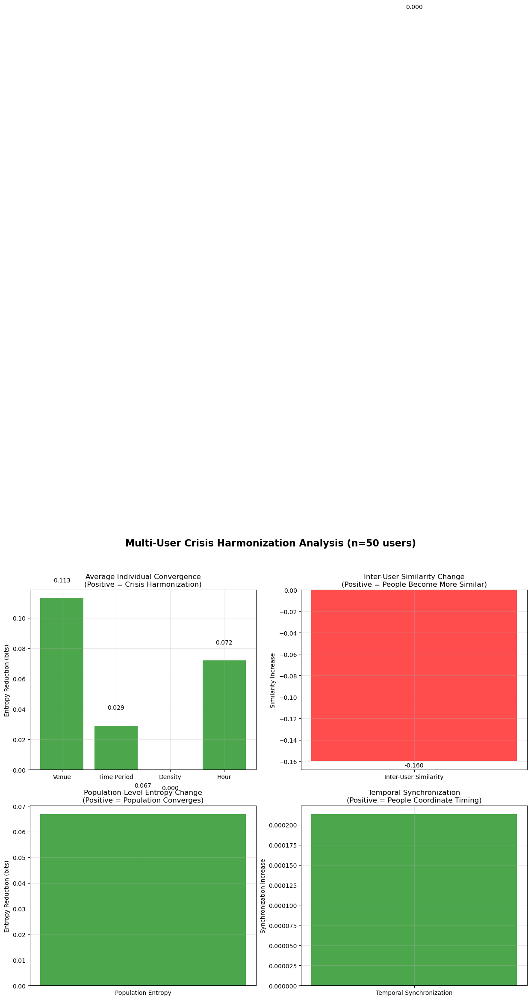


MULTI-USER EVIDENCE SYNTHESIS
❌ INDIVIDUAL CONVERGENCE: No evidence of individual consistency increase
❌ INTER-USER SIMILARITY: Users do not become more similar
❌ POPULATION CONVERGENCE: No population-level convergence
❌ TEMPORAL SYNCHRONIZATION: No evidence of temporal coordination
❌ STATISTICAL SIGNIFICANCE: Changes not statistically significant

OVERALL EVIDENCE STRENGTH: 0/5 methods support crisis harmonization
Sample size: 50 users

❌ WEAK EVIDENCE FOR CRISIS HARMONIZATION
   Limited evidence for population-level behavioral convergence

DETAILED MULTI-USER ANALYSIS RESULTS
SAMPLE SIZE: 50 users
ANALYSIS TYPE: Population-level crisis harmonization

INDIVIDUAL CONVERGENCE METRICS:
  Venue Convergence: +0.113 bits
  Time Period Convergence: +0.029 bits
  Density Convergence: +0.000 bits
  Hour Convergence: +0.072 bits

POPULATION-LEVEL METRICS:
  Inter User Similarity Increase: -0.160
  Population Entropy Reduction: +0.067
  Temporal Synchronization: +0.000

STATISTICAL SIGNIFICANCE

In [14]:
#!/usr/bin/env python
"""
Multi-User Crisis Harmonization Analysis
Tests TRUE crisis harmonization across multiple users
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
from collections import defaultdict, Counter
from datetime import datetime
from scipy import stats
from sklearn.preprocessing import StandardScaler, LabelEncoder
import json
import spacy
from textblob import TextBlob
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline
import os
import glob

warnings.filterwarnings('ignore')

# ===============================================================================
# 1. MULTI-USER DATA LOADING
# ===============================================================================

def load_all_user_files(folder_path, period_type):
    """Load all user files from folder"""
    print(f"Loading {period_type} period data from: {folder_path}")
    
    # Get all readable text files
    txt_files = glob.glob(os.path.join(folder_path, "*_readable.txt"))
    txt_files.sort()  # Ensure consistent ordering
    
    print(f"Found {len(txt_files)} user files")
    
    user_data = {}
    for file_path in txt_files:
        # Extract user ID from filename
        filename = os.path.basename(file_path)
        user_id = extract_user_id(filename)
        
        if user_id:
            try:
                with open(file_path, 'r', encoding='ISO-8859-1') as f:
                    content = f.read()
                user_data[user_id] = {
                    'file_path': file_path,
                    'content': content,
                    'period_type': period_type
                }
                print(f"  Loaded user {user_id}")
            except Exception as e:
                print(f"  Error loading {filename}: {e}")
    
    return user_data

def extract_user_id(filename):
    """Extract user ID from filename"""
    # Handle patterns like: user_0_emergency_period_readable.txt
    match = re.search(r'user_(\d+)_', filename)
    if match:
        return int(match.group(1))
    return None

def extract_daily_sections(content):
    """Extract daily sections from the file"""
    daily_data = {}
    day_sections = re.split(r'--- DAY_(\d+) ---', content)
    
    for i in range(1, len(day_sections), 2):
        if i + 1 < len(day_sections):
            day_num = int(day_sections[i])
            day_content = day_sections[i + 1]
            sentences = extract_sentences(day_content)
            
            if sentences:
                daily_data[day_num] = {
                    'raw_content': day_content,
                    'sentences': sentences,
                    'total_visits': len(sentences)
                }
    return daily_data

def extract_sentences(day_content):
    """Extract individual sentences from day content"""
    sentences = []
    sentences_section = re.search(r'Individual Sentences:(.*?)(?=Total visits:|$)', 
                                day_content, re.DOTALL)
    
    if sentences_section:
        sentences_text = sentences_section.group(1)
        sentence_matches = re.findall(r'\d+\.\s+(.+?)(?=\n\d+\.|$)', 
                                    sentences_text, re.DOTALL)
        
        for sentence in sentence_matches:
            sentence = sentence.strip()
            if sentence:
                sentences.append(sentence)
    
    return sentences

# ===============================================================================
# 2. FEATURE EXTRACTION (SAME AS BEFORE)
# ===============================================================================

def extract_time_features(sentence):
    """Extract time-related features"""
    features = {}
    
    time_match = re.search(r'At (\d{1,2}:\d{2})', sentence)
    if time_match:
        features['time'] = time_match.group(1)
        hour, minute = map(int, time_match.group(1).split(':'))
        features['hour'] = hour
        features['minute'] = minute
    
    day_match = re.search(r'on (Monday|Tuesday|Wednesday|Thursday|Friday|Saturday|Sunday)', sentence)
    if day_match:
        features['day_of_week'] = day_match.group(1)
    
    period_match = re.search(r'(early morning|morning|afternoon|evening|night)', sentence)
    if period_match:
        features['time_period'] = period_match.group(1)
    
    return features

def extract_venue_features(sentence):
    """Extract venue-related features"""
    features = {}
    
    venue_match = re.search(r'visited ([^in]+) in', sentence)
    if venue_match:
        venue = venue_match.group(1).strip()
        features['venue_type'] = venue
        features['venue_category'] = categorize_venue(venue)
    
    return features

def extract_spatial_features(sentence):
    """Extract spatial features"""
    features = {}
    
    density_match = re.search(r'(high-density|moderate-density|low-density)', sentence)
    if density_match:
        features['density'] = density_match.group(1)
    
    distance_match = re.search(r'area (inner|central|outer) from city center', sentence)
    if distance_match:
        features['distance_from_center'] = distance_match.group(1)
    
    amenity_match = re.search(r'with (limited|several|diverse) amenities', sentence)
    if amenity_match:
        features['amenity_level'] = amenity_match.group(1)
    
    return features

def categorize_venue(venue_text):
    """Categorize venue based on predefined categories"""
    venue_categories = {
        'food_service': ['restaurant', 'diner', 'food', 'fast food', 'cafe'],
        'entertainment': ['bar', 'wine bar', 'entertainment', 'casino'],
        'retail_commercial': ['store', 'convenience store', 'grocery store', 'shop'],
        'transportation': ['transit station', 'port'],
        'recreation': ['park', 'sports recreation', 'fishing'],
        'services': ['hospital', 'post office', 'school', 'office'],
        'hospitality': ['hotel', 'cafe', 'sweets']
    }
    
    if not venue_text:
        return 'unknown'
    
    venue_lower = venue_text.lower()
    for category, keywords in venue_categories.items():
        for keyword in keywords:
            if keyword in venue_lower:
                return category
    return 'other'

def combine_rule_features(sentence):
    """Combine all rule-based features"""
    features = {}
    features.update(extract_time_features(sentence))
    features.update(extract_venue_features(sentence))
    features.update(extract_spatial_features(sentence))
    features['original_sentence'] = sentence
    return features

def setup_nlp_models():
    """Setup NLP models"""
    nlp = spacy.load("en_core_web_sm")
    ner_pipeline = pipeline(
        "ner", 
        model="dbmdz/bert-large-cased-finetuned-conll03-english",
        aggregation_strategy="simple"
    )
    return nlp, ner_pipeline

def process_single_user(user_content, user_id, period_type, nlp, ner_pipeline):
    """Process a single user's data"""
    daily_data = extract_daily_sections(user_content)
    
    processed_data = {
        'user_id': user_id,
        'period_type': period_type,
        'total_days': len(daily_data),
        'daily_data': {}
    }
    
    for day_num, day_info in daily_data.items():
        processed_sentences = []
        
        for sentence in day_info['sentences']:
            # For multi-user analysis, we can use simpler feature extraction
            features = {
                'sentence': sentence,
                'rule_based': combine_rule_features(sentence),
                'reconciled': combine_rule_features(sentence)  # Simplified for speed
            }
            processed_sentences.append(features)
        
        processed_data['daily_data'][day_num] = {
            'day_number': day_num,
            'total_visits': len(processed_sentences),
            'sentences': processed_sentences
        }
    
    return processed_data

def process_all_users(normal_folder, emergency_folder, max_users=50):
    """Process all users from both folders"""
    print("="*80)
    print("MULTI-USER CRISIS HARMONIZATION ANALYSIS")
    print("="*80)
    
    # Setup NLP models
    print("1. Setting up NLP models...")
    nlp, ner_pipeline = setup_nlp_models()
    
    # Load all user data
    print("\n2. Loading user data...")
    normal_users = load_all_user_files(normal_folder, 'normal')
    emergency_users = load_all_user_files(emergency_folder, 'emergency')
    
    # Find common users (users present in both periods)
    normal_user_ids = set(normal_users.keys())
    emergency_user_ids = set(emergency_users.keys())
    common_user_ids = normal_user_ids.intersection(emergency_user_ids)
    
    print(f"\nFound {len(common_user_ids)} users with both normal and emergency data")
    
    # Limit to max_users for processing speed
    if len(common_user_ids) > max_users:
        common_user_ids = sorted(list(common_user_ids))[:max_users]
        print(f"Processing first {max_users} users for speed")
    
    # Process users
    print(f"\n3. Processing {len(common_user_ids)} users...")
    processed_normal = {}
    processed_emergency = {}
    
    for i, user_id in enumerate(common_user_ids):
        print(f"  Processing user {user_id} ({i+1}/{len(common_user_ids)})")
        
        # Process normal period
        normal_data = process_single_user(
            normal_users[user_id]['content'], 
            user_id, 
            'normal', 
            nlp, 
            ner_pipeline
        )
        processed_normal[user_id] = normal_data
        
        # Process emergency period
        emergency_data = process_single_user(
            emergency_users[user_id]['content'], 
            user_id, 
            'emergency', 
            nlp, 
            ner_pipeline
        )
        processed_emergency[user_id] = emergency_data
    
    return processed_normal, processed_emergency

# ===============================================================================
# 3. MULTI-USER ANALYSIS FUNCTIONS
# ===============================================================================

def extract_user_behavior_patterns(user_data):
    """Extract behavior patterns for a single user"""
    patterns = {'venues': [], 'time_periods': [], 'densities': [], 'hours': []}
    
    for day_data in user_data['daily_data'].values():
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            
            if reconciled.get('venue_category'):
                patterns['venues'].append(reconciled['venue_category'])
            if reconciled.get('time_period'):
                patterns['time_periods'].append(reconciled['time_period'])
            if reconciled.get('density'):
                patterns['densities'].append(reconciled['density'])
            if reconciled.get('hour'):
                patterns['hours'].append(reconciled['hour'])
    
    return patterns

def calculate_entropy(data_list):
    """Calculate Shannon entropy"""
    if not data_list:
        return 0
    
    counts = Counter(data_list)
    total = len(data_list)
    entropy = -sum((count/total) * np.log2(count/total) for count in counts.values())
    
    return entropy

def measure_population_convergence(normal_users, emergency_users):
    """Measure behavioral convergence across the population"""
    print("\n" + "="*80)
    print("POPULATION BEHAVIORAL CONVERGENCE ANALYSIS")
    print("="*80)
    
    convergence_metrics = {}
    
    # 1. Individual entropy changes
    user_entropy_changes = {
        'venues': [],
        'time_periods': [], 
        'densities': [],
        'hours': []
    }
    
    for user_id in normal_users.keys():
        if user_id in emergency_users:
            normal_patterns = extract_user_behavior_patterns(normal_users[user_id])
            emergency_patterns = extract_user_behavior_patterns(emergency_users[user_id])
            
            for pattern_type in ['venues', 'time_periods', 'densities', 'hours']:
                normal_entropy = calculate_entropy(normal_patterns[pattern_type])
                emergency_entropy = calculate_entropy(emergency_patterns[pattern_type])
                entropy_change = normal_entropy - emergency_entropy
                user_entropy_changes[pattern_type].append(entropy_change)
    
    # Calculate average entropy changes across all users
    for pattern_type in ['venues', 'time_periods', 'densities', 'hours']:
        if user_entropy_changes[pattern_type]:
            avg_change = np.mean(user_entropy_changes[pattern_type])
            convergence_metrics[f'{pattern_type.rstrip("s")}_convergence'] = avg_change
        
            print(f"{pattern_type.rstrip('s').upper()} CONVERGENCE:")
            print(f"  Average entropy reduction: {avg_change:+.3f} bits")
            print(f"  Users with convergence: {sum(1 for x in user_entropy_changes[pattern_type] if x > 0)}/{len(user_entropy_changes[pattern_type])}")
            
    # 2. Inter-user similarity analysis
    convergence_metrics.update(measure_inter_user_similarity(normal_users, emergency_users))
    
    # 3. Population-level entropy
    convergence_metrics.update(measure_population_entropy(normal_users, emergency_users))
    
    return convergence_metrics

def measure_inter_user_similarity(normal_users, emergency_users):
    """Measure how similar users become to each other"""
    print(f"\nINTER-USER SIMILARITY ANALYSIS:")
    
    similarity_metrics = {}
    
    # Calculate pairwise similarities for each period
    normal_similarities = calculate_pairwise_similarities(normal_users)
    emergency_similarities = calculate_pairwise_similarities(emergency_users)
    
    # Compare similarity changes
    similarity_change = np.mean(emergency_similarities) - np.mean(normal_similarities)
    similarity_metrics['inter_user_similarity_increase'] = similarity_change
    
    print(f"  Normal period avg similarity: {np.mean(normal_similarities):.3f}")
    print(f"  Emergency period avg similarity: {np.mean(emergency_similarities):.3f}")
    print(f"  Similarity increase: {similarity_change:+.3f}")
    
    return similarity_metrics

def calculate_pairwise_similarities(users_data):
    """Calculate pairwise similarities between users"""
    user_ids = list(users_data.keys())
    similarities = []
    
    for i in range(len(user_ids)):
        for j in range(i+1, len(user_ids)):
            user1_patterns = extract_user_behavior_patterns(users_data[user_ids[i]])
            user2_patterns = extract_user_behavior_patterns(users_data[user_ids[j]])
            
            # Calculate Jaccard similarity for venue choices
            venues1 = set(user1_patterns['venues'])
            venues2 = set(user2_patterns['venues'])
            
            if venues1 or venues2:
                similarity = len(venues1.intersection(venues2)) / len(venues1.union(venues2))
                similarities.append(similarity)
    
    return similarities

def measure_population_entropy(normal_users, emergency_users):
    """Measure population-level entropy changes"""
    print(f"\nPOPULATION-LEVEL ENTROPY ANALYSIS:")
    
    population_metrics = {}
    
    # Aggregate all behaviors across all users
    normal_all_venues = []
    emergency_all_venues = []
    
    for user_data in normal_users.values():
        patterns = extract_user_behavior_patterns(user_data)
        normal_all_venues.extend(patterns['venues'])
    
    for user_data in emergency_users.values():
        patterns = extract_user_behavior_patterns(user_data)
        emergency_all_venues.extend(patterns['venues'])
    
    # Calculate population entropy
    normal_pop_entropy = calculate_entropy(normal_all_venues)
    emergency_pop_entropy = calculate_entropy(emergency_all_venues)
    pop_entropy_change = normal_pop_entropy - emergency_pop_entropy
    
    population_metrics['population_entropy_reduction'] = pop_entropy_change
    
    print(f"  Normal population entropy: {normal_pop_entropy:.3f} bits")
    print(f"  Emergency population entropy: {emergency_pop_entropy:.3f} bits")
    print(f"  Population entropy reduction: {pop_entropy_change:+.3f} bits")
    
    return population_metrics

def measure_temporal_synchronization(normal_users, emergency_users):
    """Measure if users synchronize their timing during emergency"""
    print(f"\nTEMPORAL SYNCHRONIZATION ANALYSIS:")
    
    sync_metrics = {}
    
    # Extract all visit times for each period
    normal_hours = []
    emergency_hours = []
    
    for user_data in normal_users.values():
        patterns = extract_user_behavior_patterns(user_data)
        normal_hours.extend(patterns['hours'])
    
    for user_data in emergency_users.values():
        patterns = extract_user_behavior_patterns(user_data)
        emergency_hours.extend(patterns['hours'])
    
    # Calculate temporal clustering
    normal_hour_concentration = calculate_temporal_concentration(normal_hours)
    emergency_hour_concentration = calculate_temporal_concentration(emergency_hours)
    
    sync_increase = emergency_hour_concentration - normal_hour_concentration
    sync_metrics['temporal_synchronization'] = sync_increase
    
    print(f"  Normal temporal concentration: {normal_hour_concentration:.3f}")
    print(f"  Emergency temporal concentration: {emergency_hour_concentration:.3f}")
    print(f"  Synchronization increase: {sync_increase:+.3f}")
    
    return sync_metrics

def calculate_temporal_concentration(hours):
    """Calculate how concentrated activity is in specific hours"""
    if not hours:
        return 0
    
    hour_counts = Counter(hours)
    max_hour_count = max(hour_counts.values())
    total_visits = len(hours)
    
    return max_hour_count / total_visits

def statistical_significance_multi_user(normal_users, emergency_users):
    """Test statistical significance across multiple users"""
    print(f"\nSTATISTICAL SIGNIFICANCE TESTING (MULTI-USER):")
    
    significance_results = {}
    
    # Extract metrics for each user
    user_metrics_normal = []
    user_metrics_emergency = []
    
    for user_id in normal_users.keys():
        if user_id in emergency_users:
            normal_data = normal_users[user_id]
            emergency_data = emergency_users[user_id]
            
            # Calculate daily metrics for this user
            normal_daily = extract_daily_metrics_single_user(normal_data)
            emergency_daily = extract_daily_metrics_single_user(emergency_data)
            
            # Average metrics per user
            user_metrics_normal.append({
                'user_id': user_id,
                'avg_visits_per_day': normal_daily['visit_count'].mean(),
                'avg_unique_venues': normal_daily['unique_venues'].mean(),
                'avg_venue_changes': normal_daily['venue_changes'].mean()
            })
            
            user_metrics_emergency.append({
                'user_id': user_id,
                'avg_visits_per_day': emergency_daily['visit_count'].mean(),
                'avg_unique_venues': emergency_daily['unique_venues'].mean(),
                'avg_venue_changes': emergency_daily['venue_changes'].mean()
            })
    
    normal_df = pd.DataFrame(user_metrics_normal)
    emergency_df = pd.DataFrame(user_metrics_emergency)
    
    # Test each metric
    metrics_to_test = ['avg_visits_per_day', 'avg_unique_venues', 'avg_venue_changes']
    
    for metric in metrics_to_test:
        normal_values = normal_df[metric].dropna()
        emergency_values = emergency_df[metric].dropna()
        
        if len(normal_values) > 3 and len(emergency_values) > 3:
            statistic, p_value = stats.mannwhitneyu(
                normal_values, emergency_values, alternative='two-sided'
            )
            
            # Calculate effect size
            pooled_std = np.sqrt(
                ((len(normal_values) - 1) * np.var(normal_values) + 
                 (len(emergency_values) - 1) * np.var(emergency_values)) / 
                (len(normal_values) + len(emergency_values) - 2)
            )
            
            cohens_d = (np.mean(normal_values) - np.mean(emergency_values)) / pooled_std if pooled_std > 0 else 0
            
            significance_results[metric] = {
                'normal_mean': np.mean(normal_values),
                'emergency_mean': np.mean(emergency_values),
                'p_value': p_value,
                'significant': p_value < 0.05,
                'cohens_d': cohens_d,
                'effect_size': 'small' if abs(cohens_d) < 0.5 else 'medium' if abs(cohens_d) < 0.8 else 'large',
                'n_users': len(normal_values)
            }
            
            print(f"  {metric.upper()}:")
            print(f"    Normal mean: {np.mean(normal_values):.2f}")
            print(f"    Emergency mean: {np.mean(emergency_values):.2f}")
            print(f"    p-value: {p_value:.4f} ({'✅ Significant' if p_value < 0.05 else '❌ Not significant'})")
            print(f"    Effect size: {significance_results[metric]['effect_size']} (d = {cohens_d:.3f})")
            print(f"    Sample size: {len(normal_values)} users")
    
    return significance_results

def extract_daily_metrics_single_user(user_data):
    """Extract daily metrics for a single user"""
    daily_metrics = []
    
    for day_num, day_data in user_data['daily_data'].items():
        venues = []
        venue_changes = 0
        
        prev_venue = None
        for sentence_data in day_data['sentences']:
            reconciled = sentence_data.get('reconciled', {})
            
            venue = reconciled.get('venue_category')
            if venue:
                venues.append(venue)
                if prev_venue and venue != prev_venue:
                    venue_changes += 1
                prev_venue = venue
        
        daily_metrics.append({
            'day': day_num,
            'visit_count': len(day_data['sentences']),
            'unique_venues': len(set(venues)),
            'venue_changes': venue_changes
        })
    
    return pd.DataFrame(daily_metrics)

# ===============================================================================
# 4. VISUALIZATION FOR MULTI-USER
# ===============================================================================

def plot_multi_user_convergence(convergence_metrics, n_users):
    """Plot multi-user convergence results"""
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Multi-User Crisis Harmonization Analysis (n={n_users} users)', 
                 fontsize=16, fontweight='bold')
    
    # 1. Individual convergence
    convergence_types = ['venue_convergence', 'time_period_convergence', 'density_convergence', 'hour_convergence']
    convergence_values = [convergence_metrics.get(ct, 0) for ct in convergence_types]
    convergence_labels = ['Venue', 'Time Period', 'Density', 'Hour']
    
    colors = ['green' if v > 0 else 'red' for v in convergence_values]
    bars1 = ax1.bar(convergence_labels, convergence_values, color=colors, alpha=0.7)
    ax1.set_title('Average Individual Convergence\n(Positive = Crisis Harmonization)')
    ax1.set_ylabel('Entropy Reduction (bits)')
    ax1.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    ax1.grid(True, alpha=0.3)
    
    for bar, value in zip(bars1, convergence_values):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.01 if height > 0 else height - 0.01,
                f'{value:.3f}', ha='center', va='bottom' if height > 0 else 'top')
    
    # 2. Inter-user similarity
    similarity_change = convergence_metrics.get('inter_user_similarity_increase', 0)
    color = 'green' if similarity_change > 0 else 'red'
    ax2.bar(['Inter-User Similarity'], [similarity_change], color=color, alpha=0.7)
    ax2.set_title('Inter-User Similarity Change\n(Positive = People Become More Similar)')
    ax2.set_ylabel('Similarity Increase')
    ax2.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    ax2.grid(True, alpha=0.3)
    ax2.text(0, similarity_change + 0.001 if similarity_change > 0 else similarity_change - 0.001,
             f'{similarity_change:.3f}', ha='center', va='bottom' if similarity_change > 0 else 'top')
    
    # 3. Population entropy
    pop_entropy_change = convergence_metrics.get('population_entropy_reduction', 0)
    color = 'green' if pop_entropy_change > 0 else 'red'
    ax3.bar(['Population Entropy'], [pop_entropy_change], color=color, alpha=0.7)
    ax3.set_title('Population-Level Entropy Change\n(Positive = Population Converges)')
    ax3.set_ylabel('Entropy Reduction (bits)')
    ax3.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    ax3.grid(True, alpha=0.3)
    ax3.text(0, pop_entropy_change + 0.01 if pop_entropy_change > 0 else pop_entropy_change - 0.01,
             f'{pop_entropy_change:.3f}', ha='center', va='bottom' if pop_entropy_change > 0 else 'top')
    
    # 4. Temporal synchronization
    temporal_sync = convergence_metrics.get('temporal_synchronization', 0)
    color = 'green' if temporal_sync > 0 else 'red'
    ax4.bar(['Temporal Synchronization'], [temporal_sync], color=color, alpha=0.7)
    ax4.set_title('Temporal Synchronization\n(Positive = People Coordinate Timing)')
    ax4.set_ylabel('Synchronization Increase')
    ax4.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    ax4.grid(True, alpha=0.3)
    ax4.text(0, temporal_sync + 0.001 if temporal_sync > 0 else temporal_sync - 0.001,
             f'{temporal_sync:.3f}', ha='center', va='bottom' if temporal_sync > 0 else 'top')
    
    plt.tight_layout()
    plt.show()

def synthesize_multi_user_evidence(convergence_metrics, significance_results, n_users):
    """Synthesize evidence from multi-user analysis"""
    print("\n" + "="*80)
    print("MULTI-USER EVIDENCE SYNTHESIS")
    print("="*80)
    
    evidence_count = 0
    
    # Individual convergence
    individual_convergences = [
        convergence_metrics.get('venue_convergence', 0),
        convergence_metrics.get('time_period_convergence', 0),
        convergence_metrics.get('density_convergence', 0),
        convergence_metrics.get('hour_convergence', 0)
    ]
    avg_individual_convergence = np.mean(individual_convergences)
    
    if avg_individual_convergence > 0.1:
        evidence_count += 1
        print("✅ INDIVIDUAL CONVERGENCE: Users individually become more consistent")
    else:
        print("❌ INDIVIDUAL CONVERGENCE: No evidence of individual consistency increase")
    
    # Inter-user similarity
    similarity_increase = convergence_metrics.get('inter_user_similarity_increase', 0)
    if similarity_increase > 0.05:
        evidence_count += 1
        print("✅ INTER-USER SIMILARITY: Users become more similar to each other")
    else:
        print("❌ INTER-USER SIMILARITY: Users do not become more similar")
    
    # Population convergence
    pop_convergence = convergence_metrics.get('population_entropy_reduction', 0)
    if pop_convergence > 0.1:
        evidence_count += 1
        print("✅ POPULATION CONVERGENCE: Population-level behavioral diversity decreases")
    else:
        print("❌ POPULATION CONVERGENCE: No population-level convergence")
    
    # Temporal synchronization
    temporal_sync = convergence_metrics.get('temporal_synchronization', 0)
    if temporal_sync > 0.05:
        evidence_count += 1
        print("✅ TEMPORAL SYNCHRONIZATION: Users coordinate their timing")
    else:
        print("❌ TEMPORAL SYNCHRONIZATION: No evidence of temporal coordination")
    
    # Statistical significance
    significant_count = sum(1 for test in significance_results.values() if test['significant'])
    total_tests = len(significance_results)
    if significant_count >= total_tests * 0.5:
        evidence_count += 1
        print("✅ STATISTICAL SIGNIFICANCE: Changes are statistically significant")
    else:
        print("❌ STATISTICAL SIGNIFICANCE: Changes not statistically significant")
    
    print(f"\nOVERALL EVIDENCE STRENGTH: {evidence_count}/5 methods support crisis harmonization")
    print(f"Sample size: {n_users} users")
    
    if evidence_count >= 4:
        print("\n🏆 STRONG EVIDENCE FOR CRISIS HARMONIZATION")
        print("   Multiple independent methods confirm population-level behavioral convergence")
    elif evidence_count >= 3:
        print("\n⚠️  MODERATE EVIDENCE FOR CRISIS HARMONIZATION")
        print("   Some evidence suggests population-level behavioral changes")
    else:
        print("\n❌ WEAK EVIDENCE FOR CRISIS HARMONIZATION")
        print("   Limited evidence for population-level behavioral convergence")

# ===============================================================================
# 5. MAIN EXECUTION PIPELINE
# ===============================================================================

def run_multi_user_analysis(normal_folder, emergency_folder, max_users=50):
    """Run complete multi-user crisis harmonization analysis"""
    print("MULTI-USER CRISIS HARMONIZATION ANALYSIS")
    print("="*80)
    print("Testing TRUE crisis harmonization across multiple users")
    print("="*80)
    
    # Process all users
    processed_normal, processed_emergency = process_all_users(
        normal_folder, emergency_folder, max_users
    )
    
    n_users = len(processed_normal)
    print(f"\n4. Analyzing {n_users} users...")
    
    # Run multi-user convergence analysis
    convergence_metrics = measure_population_convergence(processed_normal, processed_emergency)
    
    # Add temporal synchronization
    sync_metrics = measure_temporal_synchronization(processed_normal, processed_emergency)
    convergence_metrics.update(sync_metrics)
    
    # Statistical significance testing
    significance_results = statistical_significance_multi_user(processed_normal, processed_emergency)
    
    # Generate visualizations
    print(f"\n5. Generating visualizations...")
    plot_multi_user_convergence(convergence_metrics, n_users)
    
    # Synthesize evidence
    synthesize_multi_user_evidence(convergence_metrics, significance_results, n_users)
    
    # Return comprehensive results
    return {
        'processed_normal': processed_normal,
        'processed_emergency': processed_emergency,
        'convergence_metrics': convergence_metrics,
        'significance_results': significance_results,
        'n_users': n_users,
        'analysis_type': 'multi_user'
    }

def print_detailed_results(results):
    """Print detailed analysis results"""
    print("\n" + "="*80)
    print("DETAILED MULTI-USER ANALYSIS RESULTS")
    print("="*80)
    
    convergence = results['convergence_metrics']
    significance = results['significance_results']
    n_users = results['n_users']
    
    print(f"SAMPLE SIZE: {n_users} users")
    print(f"ANALYSIS TYPE: Population-level crisis harmonization")
    
    print(f"\nINDIVIDUAL CONVERGENCE METRICS:")
    individual_metrics = ['venue_convergence', 'time_period_convergence', 'density_convergence', 'hour_convergence']
    for metric in individual_metrics:
        value = convergence.get(metric, 0)
        print(f"  {metric.replace('_', ' ').title()}: {value:+.3f} bits")
    
    print(f"\nPOPULATION-LEVEL METRICS:")
    population_metrics = ['inter_user_similarity_increase', 'population_entropy_reduction', 'temporal_synchronization']
    for metric in population_metrics:
        value = convergence.get(metric, 0)
        print(f"  {metric.replace('_', ' ').title()}: {value:+.3f}")
    
    print(f"\nSTATISTICAL SIGNIFICANCE:")
    for metric, stats in significance.items():
        print(f"  {metric.upper()}:")
        print(f"    Difference: {stats['normal_mean']:.2f} → {stats['emergency_mean']:.2f}")
        print(f"    Significant: {'✅ YES' if stats['significant'] else '❌ NO'} (p = {stats['p_value']:.4f})")
        print(f"    Effect size: {stats['effect_size']} (Cohen's d = {stats['cohens_d']:.3f})")

# ===============================================================================
# 6. USAGE INSTRUCTIONS
# ===============================================================================

def main():
    """
    USAGE INSTRUCTIONS:
    
    1. Set your folder paths below
    2. Run the script
    3. Results will show TRUE crisis harmonization across multiple users
    """
    
    # ===== CHANGE THESE PATHS TO YOUR FOLDERS =====
    normal_folder = "C:\\Users\\ashri\\Documents\\Anomaly Research\\UserMobilityTexts\\detailed_style\\normal_period\\"      # Folder with normal period files
    emergency_folder = "C:\\Users\\ashri\\Documents\\Anomaly Research\\UserMobilityTexts\\detailed_style\\emergency_period\\" # Folder with emergency period files
    max_users = 50  # Limit number of users for processing speed
    
    # Run the analysis
    results = run_multi_user_analysis(normal_folder, emergency_folder, max_users)
    
    # Print detailed results
    print_detailed_results(results)
    
    print("\n" + "="*80)
    print("ANALYSIS COMPLETE!")
    print("="*80)
    print("This analysis tested TRUE crisis harmonization by:")
    print("  ✅ Analyzing multiple users (not just one)")
    print("  ✅ Measuring inter-user behavioral convergence")
    print("  ✅ Testing population-level entropy changes")
    print("  ✅ Detecting temporal synchronization")
    print("  ✅ Statistical significance across users")
    print("="*80)

if __name__ == "__main__":
    main()


COMPLETE TRAJECTORY ANOMALY DETECTION FRAMEWORK
Extending multi-user analysis to detect trajectory anomalies
MULTI-USER CRISIS HARMONIZATION ANALYSIS
1. Setting up NLP models...


Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu



2. Loading user data...
Loading normal period data from: C:\Users\ashri\Documents\Anomaly Research\UserMobilityTexts\detailed_style\normal_period\
Found 100 user files
  Loaded user 10
  Loaded user 11
  Loaded user 12
  Loaded user 13
  Loaded user 14
  Loaded user 15
  Loaded user 16
  Loaded user 17
  Loaded user 18
  Loaded user 19
  Loaded user 1
  Loaded user 20
  Loaded user 21
  Loaded user 22
  Loaded user 23
  Loaded user 24
  Loaded user 25
  Loaded user 26
  Loaded user 27
  Loaded user 28
  Loaded user 29
  Loaded user 2
  Loaded user 30
  Loaded user 31
  Loaded user 32
  Loaded user 33
  Loaded user 34
  Loaded user 35
  Loaded user 36
  Loaded user 37
  Loaded user 38
  Loaded user 39
  Loaded user 3
  Loaded user 40
  Loaded user 41
  Loaded user 42
  Loaded user 43
  Loaded user 44
  Loaded user 45
  Loaded user 46
  Loaded user 47
  Loaded user 48
  Loaded user 49
  Loaded user 4
  Loaded user 50
  Loaded user 51
  Loaded user 52
  Loaded user 53
  Loaded user 54
  

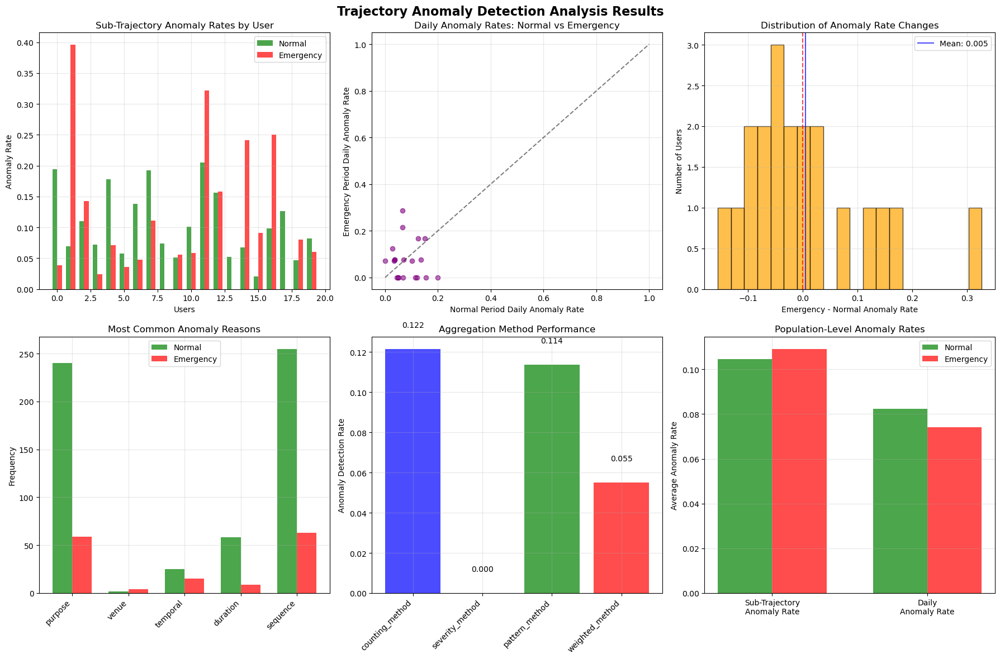


TRAJECTORY ANALYSIS COMPLETE!
Results include:
  ✅ Sub-trajectory extraction and anomaly detection
  ✅ Daily trajectory anomaly aggregation
  ✅ Multiple aggregation methods comparison
  ✅ Population-level trajectory pattern analysis
  ✅ Comprehensive visualizations and reporting


In [15]:
#!/usr/bin/env python
"""
Complete Trajectory Anomaly Detection Framework
Extends the multi-user crisis analysis to detect sub-trajectory and overall trajectory anomalies
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
from collections import defaultdict, Counter
from datetime import datetime, timedelta
from scipy import stats
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import DBSCAN
from sklearn.ensemble import IsolationForest
import json
import spacy
from textblob import TextBlob
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline
import os
import glob

warnings.filterwarnings('ignore')

# ===============================================================================
# 1. SUB-TRAJECTORY EXTRACTION
# ===============================================================================

class SubTrajectoryExtractor:
    """Extract individual trips from daily mobility data"""
    
    def __init__(self):
        self.home_keywords = ['home', 'house', 'residence', 'apartment']
        self.trip_boundary_gap_minutes = 60  # If gap > 60 min, new trip
        
    def extract_sub_trajectories(self, daily_data):
        """Extract sub-trajectories from daily sentences"""
        sub_trajectories = []
        
        for day_num, day_info in daily_data.items():
            day_subtrajs = self.extract_day_subtrajectories(day_info, day_num)
            sub_trajectories.extend(day_subtrajs)
        
        return sub_trajectories
    
    def extract_day_subtrajectories(self, day_info, day_num):
        """Extract sub-trajectories for a single day"""
        sentences = day_info['sentences']
        day_subtrajs = []
        
        if not sentences:
            return day_subtrajs
        
        # Group sentences into trips based on location changes and time gaps
        trips = self.group_sentences_into_trips(sentences)
        
        for trip_id, trip_sentences in enumerate(trips):
            sub_traj = self.create_subtrajectory_object(trip_sentences, day_num, trip_id)
            if sub_traj:
                day_subtrajs.append(sub_traj)
        
        return day_subtrajs
    
    def group_sentences_into_trips(self, sentences):
        """Group consecutive sentences into logical trips"""
        trips = []
        current_trip = []
        last_time = None
        last_venue = None
        
        for sentence_data in sentences:
            reconciled = sentence_data.get('reconciled', {})
            current_venue = reconciled.get('venue_category', 'unknown')
            current_time = self.parse_time(reconciled.get('time'))
            
            # Decision rules for trip boundaries
            start_new_trip = False
            
            # Rule 1: Return to home starts new trip (unless it's the first location)
            if (current_venue in self.home_keywords and 
                last_venue and last_venue not in self.home_keywords):
                if current_trip:  # End current trip
                    current_trip.append(sentence_data)
                    trips.append(current_trip)
                    current_trip = [sentence_data]  # Start new trip with home
                else:
                    current_trip.append(sentence_data)
            
            # Rule 2: Large time gap indicates new trip
            elif (last_time and current_time and 
                  abs((current_time - last_time).total_seconds()) > self.trip_boundary_gap_minutes * 60):
                if current_trip:
                    trips.append(current_trip)
                current_trip = [sentence_data]
            
            # Rule 3: Continue current trip
            else:
                current_trip.append(sentence_data)
            
            last_time = current_time
            last_venue = current_venue
        
        # Add final trip
        if current_trip:
            trips.append(current_trip)
        
        return trips
    
    def create_subtrajectory_object(self, trip_sentences, day_num, trip_id):
        """Create structured sub-trajectory object"""
        if not trip_sentences:
            return None
        
        venues = []
        venue_categories = []
        times = []
        coordinates = []
        
        for sentence_data in trip_sentences:
            reconciled = sentence_data.get('reconciled', {})
            
            if reconciled.get('venue_category'):
                venues.append(reconciled.get('venue_type', 'unknown'))
                venue_categories.append(reconciled['venue_category'])
            
            if reconciled.get('time'):
                times.append(reconciled['time'])
        
        if not venues:  # Skip if no valid venues
            return None
        
        # Calculate trip characteristics
        start_time = times[0] if times else None
        end_time = times[-1] if times else None
        duration = self.calculate_duration(start_time, end_time)
        trip_purpose = self.infer_trip_purpose(venue_categories)
        
        sub_trajectory = {
            'id': f"day_{day_num}_trip_{trip_id}",
            'day': day_num,
            'trip_id': trip_id,
            'start_time': start_time,
            'end_time': end_time,
            'duration_minutes': duration,
            'venues': venues,
            'venue_categories': venue_categories,
            'venue_sequence': ' → '.join(venues),
            'category_sequence': ' → '.join(venue_categories),
            'trip_purpose': trip_purpose,
            'trip_length': len(venues),
            'unique_venues': len(set(venue_categories)),
            'sentences': trip_sentences,
            'raw_data': trip_sentences
        }
        
        return sub_trajectory
    
    def parse_time(self, time_str):
        """Parse time string to datetime object"""
        if not time_str or ':' not in time_str:
            return None
        
        try:
            hour, minute = map(int, time_str.split(':'))
            return datetime(2025, 1, 1, hour, minute)  # Use dummy date
        except:
            return None
    
    def calculate_duration(self, start_time_str, end_time_str):
        """Calculate trip duration in minutes"""
        start_time = self.parse_time(start_time_str)
        end_time = self.parse_time(end_time_str)
        
        if start_time and end_time:
            duration = (end_time - start_time).total_seconds() / 60
            return max(duration, 0)  # Ensure non-negative
        
        return None
    
    def infer_trip_purpose(self, venue_categories):
        """Infer the main purpose of the trip"""
        if not venue_categories:
            return 'unknown'
        
        # Count venue types
        venue_counts = Counter(venue_categories)
        
        # Remove home from purpose inference
        non_home_venues = [v for v in venue_categories if v not in self.home_keywords]
        
        if not non_home_venues:
            return 'home_based'
        
        # Primary purpose based on most common non-home venue
        primary_venue = Counter(non_home_venues).most_common(1)[0][0]
        
        purpose_map = {
            'food_service': 'dining',
            'retail_commercial': 'shopping',
            'services': 'services',
            'recreation': 'recreation',
            'transportation': 'transit',
            'entertainment': 'entertainment',
            'hospitality': 'social'
        }
        
        return purpose_map.get(primary_venue, primary_venue)

# ===============================================================================
# 2. USER PATTERN LEARNING
# ===============================================================================

class UserPatternLearner:
    """Learn normal patterns for individual users"""
    
    def __init__(self, learning_period_days=30):
        self.learning_period_days = learning_period_days
        
    def learn_user_patterns(self, user_sub_trajectories, period='normal'):
        """Learn what's normal for this user"""
        # Filter to learning period
        learning_trajectories = [
            traj for traj in user_sub_trajectories 
            if traj.get('period_type', 'normal') == period
        ]
        
        if len(learning_trajectories) < 5:  # Need minimum data
            return self.create_default_patterns()
        
        patterns = {
            'venue_patterns': self.learn_venue_patterns(learning_trajectories),
            'temporal_patterns': self.learn_temporal_patterns(learning_trajectories),
            'sequence_patterns': self.learn_sequence_patterns(learning_trajectories),
            'trip_characteristics': self.learn_trip_characteristics(learning_trajectories),
            'daily_patterns': self.learn_daily_patterns(learning_trajectories)
        }
        
        return patterns
    
    def learn_venue_patterns(self, trajectories):
        """Learn typical venue preferences"""
        all_venues = []
        all_categories = []
        
        for traj in trajectories:
            all_venues.extend(traj.get('venues', []))
            all_categories.extend(traj.get('venue_categories', []))
        
        venue_freq = Counter(all_venues)
        category_freq = Counter(all_categories)
        
        return {
            'common_venues': set(venue for venue, count in venue_freq.items() if count >= 2),
            'common_categories': set(cat for cat, count in category_freq.items() if count >= 2),
            'venue_frequencies': dict(venue_freq),
            'category_frequencies': dict(category_freq),
            'total_unique_venues': len(venue_freq),
            'total_unique_categories': len(category_freq)
        }
    
    def learn_temporal_patterns(self, trajectories):
        """Learn typical timing patterns"""
        start_times = []
        durations = []
        
        for traj in trajectories:
            if traj.get('start_time'):
                hour = int(traj['start_time'].split(':')[0])
                start_times.append(hour)
            
            if traj.get('duration_minutes'):
                durations.append(traj['duration_minutes'])
        
        patterns = {
            'typical_start_hours': start_times,
            'typical_durations': durations
        }
        
        if start_times:
            patterns.update({
                'avg_start_hour': np.mean(start_times),
                'start_hour_std': np.std(start_times),
                'common_start_hours': set(h for h, c in Counter(start_times).items() if c >= 2)
            })
        
        if durations:
            patterns.update({
                'avg_duration': np.mean(durations),
                'duration_std': np.std(durations),
                'min_duration': min(durations),
                'max_duration': max(durations)
            })
        
        return patterns
    
    def learn_sequence_patterns(self, trajectories):
        """Learn typical venue sequences"""
        sequences = []
        category_sequences = []
        
        for traj in trajectories:
            if traj.get('venue_sequence'):
                sequences.append(traj['venue_sequence'])
            if traj.get('category_sequence'):
                category_sequences.append(traj['category_sequence'])
        
        return {
            'common_sequences': Counter(sequences),
            'common_category_sequences': Counter(category_sequences),
            'unique_sequences': len(set(sequences)),
            'sequence_diversity': len(set(sequences)) / max(len(sequences), 1)
        }
    
    def learn_trip_characteristics(self, trajectories):
        """Learn typical trip characteristics"""
        trip_lengths = []
        unique_venue_counts = []
        purposes = []
        
        for traj in trajectories:
            if traj.get('trip_length'):
                trip_lengths.append(traj['trip_length'])
            if traj.get('unique_venues'):
                unique_venue_counts.append(traj['unique_venues'])
            if traj.get('trip_purpose'):
                purposes.append(traj['trip_purpose'])
        
        patterns = {
            'typical_trip_lengths': trip_lengths,
            'typical_unique_venues': unique_venue_counts,
            'common_purposes': Counter(purposes)
        }
        
        if trip_lengths:
            patterns.update({
                'avg_trip_length': np.mean(trip_lengths),
                'trip_length_std': np.std(trip_lengths)
            })
        
        if unique_venue_counts:
            patterns.update({
                'avg_unique_venues': np.mean(unique_venue_counts),
                'unique_venues_std': np.std(unique_venue_counts)
            })
        
        return patterns
    
    def learn_daily_patterns(self, trajectories):
        """Learn daily-level patterns"""
        daily_stats = defaultdict(list)
        
        # Group by day
        by_day = defaultdict(list)
        for traj in trajectories:
            by_day[traj['day']].append(traj)
        
        for day, day_trajs in by_day.items():
            daily_stats['trips_per_day'].append(len(day_trajs))
            daily_stats['daily_unique_venues'].append(
                len(set(venue for traj in day_trajs for venue in traj.get('venue_categories', [])))
            )
            daily_stats['daily_purposes'].append(
                len(set(traj.get('trip_purpose', 'unknown') for traj in day_trajs))
            )
        
        patterns = {}
        for stat_name, values in daily_stats.items():
            if values:
                patterns[f'avg_{stat_name}'] = np.mean(values)
                patterns[f'{stat_name}_std'] = np.std(values)
                patterns[f'{stat_name}_min'] = min(values)
                patterns[f'{stat_name}_max'] = max(values)
        
        return patterns
    
    def create_default_patterns(self):
        """Create default patterns when insufficient data"""
        return {
            'venue_patterns': {
                'common_venues': set(),
                'common_categories': set(),
                'venue_frequencies': {},
                'category_frequencies': {},
                'total_unique_venues': 0,
                'total_unique_categories': 0
            },
            'temporal_patterns': {
                'typical_start_hours': [],
                'typical_durations': [],
                'avg_start_hour': 12,
                'start_hour_std': 4,
                'avg_duration': 60,
                'duration_std': 30
            },
            'sequence_patterns': {
                'common_sequences': Counter(),
                'common_category_sequences': Counter(),
                'unique_sequences': 0,
                'sequence_diversity': 0
            },
            'trip_characteristics': {
                'avg_trip_length': 3,
                'trip_length_std': 1,
                'avg_unique_venues': 2,
                'unique_venues_std': 1,
                'common_purposes': Counter()
            },
            'daily_patterns': {
                'avg_trips_per_day': 4,
                'trips_per_day_std': 2,
                'avg_daily_unique_venues': 3,
                'daily_unique_venues_std': 1
            }
        }

# ===============================================================================
# 3. SUB-TRAJECTORY ANOMALY DETECTION
# ===============================================================================

class SubTrajectoryAnomalyDetector:
    """Detect anomalies in individual sub-trajectories"""
    
    def __init__(self, anomaly_threshold=0.5):
        self.anomaly_threshold = anomaly_threshold
        
    def detect_subtraj_anomalies(self, sub_trajectory, user_patterns):
        """Detect anomalies in a single sub-trajectory"""
        
        anomaly_scores = {
            'venue_anomaly': self.calculate_venue_anomaly(sub_trajectory, user_patterns),
            'temporal_anomaly': self.calculate_temporal_anomaly(sub_trajectory, user_patterns),
            'sequence_anomaly': self.calculate_sequence_anomaly(sub_trajectory, user_patterns),
            'duration_anomaly': self.calculate_duration_anomaly(sub_trajectory, user_patterns),
            'purpose_anomaly': self.calculate_purpose_anomaly(sub_trajectory, user_patterns)
        }
        
        # Calculate overall anomaly score
        overall_score = np.mean(list(anomaly_scores.values()))
        
        # Determine if anomalous
        is_anomalous = overall_score > self.anomaly_threshold
        
        # Add results to sub-trajectory
        sub_trajectory.update({
            'anomaly_scores': anomaly_scores,
            'overall_anomaly_score': overall_score,
            'is_anomalous': is_anomalous,
            'anomaly_reasons': self.identify_anomaly_reasons(anomaly_scores)
        })
        
        return sub_trajectory
    
    def calculate_venue_anomaly(self, sub_traj, patterns):
        """Calculate how unusual the venues are"""
        venues = sub_traj.get('venue_categories', [])
        venue_patterns = patterns['venue_patterns']
        
        if not venues or not venue_patterns['common_categories']:
            return 0.0
        
        # Calculate overlap with typical venues
        common_venues = venue_patterns['common_categories']
        venue_overlap = len(set(venues).intersection(common_venues))
        total_venues = len(set(venues))
        
        if total_venues == 0:
            return 0.0
        
        overlap_ratio = venue_overlap / total_venues
        anomaly_score = 1.0 - overlap_ratio  # Higher when less overlap
        
        return min(anomaly_score, 1.0)
    
    def calculate_temporal_anomaly(self, sub_traj, patterns):
        """Calculate how unusual the timing is"""
        start_time = sub_traj.get('start_time')
        temporal_patterns = patterns['temporal_patterns']
        
        if not start_time or not temporal_patterns.get('typical_start_hours'):
            return 0.0
        
        try:
            hour = int(start_time.split(':')[0])
            avg_hour = temporal_patterns.get('avg_start_hour', 12)
            hour_std = temporal_patterns.get('start_hour_std', 4)
            
            # Z-score based anomaly
            if hour_std > 0:
                z_score = abs(hour - avg_hour) / hour_std
                anomaly_score = min(z_score / 3.0, 1.0)  # Normalize to 0-1
            else:
                anomaly_score = 0.0 if hour == avg_hour else 1.0
            
            return anomaly_score
        except:
            return 0.0
    
    def calculate_sequence_anomaly(self, sub_traj, patterns):
        """Calculate how unusual the venue sequence is"""
        sequence = sub_traj.get('category_sequence', '')
        sequence_patterns = patterns['sequence_patterns']
        
        if not sequence or not sequence_patterns['common_category_sequences']:
            return 0.0
        
        # Check if this exact sequence has been seen before
        common_sequences = sequence_patterns['common_category_sequences']
        
        if sequence in common_sequences:
            # Frequency-based score (more common = less anomalous)
            frequency = common_sequences[sequence]
            total_sequences = sum(common_sequences.values())
            anomaly_score = 1.0 - (frequency / total_sequences)
        else:
            # Completely new sequence
            anomaly_score = 0.8  # High but not maximum (might be valid new pattern)
        
        return min(anomaly_score, 1.0)
    
    def calculate_duration_anomaly(self, sub_traj, patterns):
        """Calculate how unusual the trip duration is"""
        duration = sub_traj.get('duration_minutes')
        temporal_patterns = patterns['temporal_patterns']
        
        if duration is None or not temporal_patterns.get('typical_durations'):
            return 0.0
        
        avg_duration = temporal_patterns.get('avg_duration', 60)
        duration_std = temporal_patterns.get('duration_std', 30)
        
        if duration_std > 0:
            z_score = abs(duration - avg_duration) / duration_std
            anomaly_score = min(z_score / 3.0, 1.0)  # Normalize to 0-1
        else:
            anomaly_score = 0.0 if duration == avg_duration else 1.0
        
        return anomaly_score
    
    def calculate_purpose_anomaly(self, sub_traj, patterns):
        """Calculate how unusual the trip purpose is"""
        purpose = sub_traj.get('trip_purpose', 'unknown')
        trip_patterns = patterns['trip_characteristics']
        
        common_purposes = trip_patterns.get('common_purposes', Counter())
        
        if not common_purposes or purpose == 'unknown':
            return 0.0
        
        if purpose in common_purposes:
            # Frequency-based score
            frequency = common_purposes[purpose]
            total_purposes = sum(common_purposes.values())
            anomaly_score = 1.0 - (frequency / total_purposes)
        else:
            # New purpose
            anomaly_score = 0.7  # High but not maximum
        
        return min(anomaly_score, 1.0)
    
    def identify_anomaly_reasons(self, anomaly_scores, threshold=0.6):
        """Identify which aspects make the trip anomalous"""
        reasons = []
        
        for aspect, score in anomaly_scores.items():
            if score > threshold:
                reasons.append(aspect.replace('_anomaly', ''))
        
        return reasons

# ===============================================================================
# 4. DAILY TRAJECTORY ANOMALY AGGREGATION
# ===============================================================================

class DailyTrajectoryAggregator:
    """Aggregate sub-trajectory anomalies to daily level"""
    
    def __init__(self):
        self.aggregation_methods = [
            'counting_method',
            'severity_method', 
            'pattern_method',
            'weighted_method'
        ]
    
    def aggregate_daily_anomalies(self, daily_sub_trajectories, user_patterns):
        """Aggregate sub-trajectory anomalies to determine daily anomaly"""
        
        if not daily_sub_trajectories:
            return self.create_empty_daily_analysis()
        
        # Calculate daily statistics
        daily_stats = self.calculate_daily_stats(daily_sub_trajectories, user_patterns)
        
        # Apply different aggregation methods
        aggregation_results = {}
        for method in self.aggregation_methods:
            method_func = getattr(self, method)
            aggregation_results[method] = method_func(daily_sub_trajectories, user_patterns)
        
        # Determine overall daily anomaly using ensemble
        ensemble_decision = self.ensemble_decision(aggregation_results)
        
        daily_analysis = {
            'daily_stats': daily_stats,
            'aggregation_results': aggregation_results,
            'ensemble_decision': ensemble_decision,
            'anomalous_subtrajs': sum(1 for traj in daily_sub_trajectories if traj.get('is_anomalous', False)),
            'total_subtrajs': len(daily_sub_trajectories),
            'anomalous_percentage': sum(1 for traj in daily_sub_trajectories if traj.get('is_anomalous', False)) / len(daily_sub_trajectories),
            'max_subtraj_anomaly': max((traj.get('overall_anomaly_score', 0) for traj in daily_sub_trajectories), default=0),
            'avg_subtraj_anomaly': np.mean([traj.get('overall_anomaly_score', 0) for traj in daily_sub_trajectories]),
            'anomaly_reasons': self.collect_anomaly_reasons(daily_sub_trajectories)
        }
        
        return daily_analysis
    
    def counting_method(self, sub_trajectories, user_patterns, threshold=0.5):
        """Method 1: If X% of sub-trajectories are anomalous, day is anomalous"""
        anomalous_count = sum(1 for traj in sub_trajectories if traj.get('is_anomalous', False))
        total_count = len(sub_trajectories)
        
        if total_count == 0:
            return {'is_anomalous': False, 'score': 0.0, 'method': 'counting'}
        
        anomalous_ratio = anomalous_count / total_count
        is_anomalous = anomalous_ratio >= threshold
        
        return {
            'is_anomalous': is_anomalous,
            'score': anomalous_ratio,
            'method': 'counting',
            'threshold': threshold,
            'anomalous_trips': anomalous_count,
            'total_trips': total_count
        }
    
    def severity_method(self, sub_trajectories, user_patterns, threshold=0.8):
        """Method 2: If any sub-trajectory is extremely anomalous, day is anomalous"""
        max_anomaly = max((traj.get('overall_anomaly_score', 0) for traj in sub_trajectories), default=0)
        is_anomalous = max_anomaly >= threshold
        
        return {
            'is_anomalous': is_anomalous,
            'score': max_anomaly,
            'method': 'severity',
            'threshold': threshold,
            'max_anomaly_score': max_anomaly
        }
    
    def pattern_method(self, sub_trajectories, user_patterns, threshold=0.6):
        """Method 3: If overall daily pattern is unusual, day is anomalous"""
        daily_patterns = user_patterns.get('daily_patterns', {})
        
        # Calculate daily pattern features
        total_trips = len(sub_trajectories)
        unique_venues = len(set(venue for traj in sub_trajectories 
                               for venue in traj.get('venue_categories', [])))
        unique_purposes = len(set(traj.get('trip_purpose', 'unknown') for traj in sub_trajectories))
        
        # Compare to typical patterns
        pattern_anomaly_scores = []
        
        # Trip count anomaly
        if daily_patterns.get('avg_trips_per_day'):
            avg_trips = daily_patterns['avg_trips_per_day']
            trips_std = daily_patterns.get('trips_per_day_std', 1)
            trip_z_score = abs(total_trips - avg_trips) / max(trips_std, 1)
            pattern_anomaly_scores.append(min(trip_z_score / 2.0, 1.0))
        
        # Venue diversity anomaly
        if daily_patterns.get('avg_daily_unique_venues'):
            avg_venues = daily_patterns['avg_daily_unique_venues']
            venues_std = daily_patterns.get('daily_unique_venues_std', 1)
            venue_z_score = abs(unique_venues - avg_venues) / max(venues_std, 1)
            pattern_anomaly_scores.append(min(venue_z_score / 2.0, 1.0))
        
        overall_pattern_score = np.mean(pattern_anomaly_scores) if pattern_anomaly_scores else 0.0
        is_anomalous = overall_pattern_score >= threshold
        
        return {
            'is_anomalous': is_anomalous,
            'score': overall_pattern_score,
            'method': 'pattern',
            'threshold': threshold,
            'pattern_features': {
                'total_trips': total_trips,
                'unique_venues': unique_venues,
                'unique_purposes': unique_purposes
            }
        }
    
    def weighted_method(self, sub_trajectories, user_patterns, threshold=0.5):
        """Method 4: Weighted combination of sub-trajectory scores"""
        if not sub_trajectories:
            return {'is_anomalous': False, 'score': 0.0, 'method': 'weighted'}
        
        # Assign weights based on trip importance
        weighted_scores = []
        
        for traj in sub_trajectories:
            weight = self.calculate_trip_weight(traj, user_patterns)
            score = traj.get('overall_anomaly_score', 0)
            weighted_scores.append(weight * score)
        
        # Calculate weighted average
        total_weight = sum(self.calculate_trip_weight(traj, user_patterns) for traj in sub_trajectories)
        
        if total_weight > 0:
            weighted_avg = sum(weighted_scores) / total_weight
        else:
            weighted_avg = np.mean([traj.get('overall_anomaly_score', 0) for traj in sub_trajectories])
        
        is_anomalous = weighted_avg >= threshold
        
        return {
            'is_anomalous': is_anomalous,
            'score': weighted_avg,
            'method': 'weighted',
            'threshold': threshold,
            'total_weight': total_weight
        }
    
    def calculate_trip_weight(self, sub_trajectory, user_patterns):
        """Calculate importance weight for a trip"""
        weight = 1.0  # Base weight
        
        # Weight by duration (longer trips more important)
        duration = sub_trajectory.get('duration_minutes', 60)
        weight *= min(duration / 60.0, 3.0)  # Cap at 3x weight
        
        # Weight by purpose importance
        purpose = sub_trajectory.get('trip_purpose', 'unknown')
        purpose_weights = {
            'services': 1.5,  # Medical, official business
            'work': 1.3,      # Work-related
            'shopping': 1.0,  # Regular importance
            'dining': 0.8,    # Less critical
            'recreation': 0.7, # Leisure
            'social': 0.7,    # Social visits
            'unknown': 0.5    # Uncertain importance
        }
        weight *= purpose_weights.get(purpose, 1.0)
        
        # Weight by venue uniqueness (unusual venues more important)
        venue_anomaly = sub_trajectory.get('anomaly_scores', {}).get('venue_anomaly', 0)
        weight *= (1.0 + venue_anomaly * 0.5)  # Up to 1.5x for very unusual venues
        
        return weight
    
    def ensemble_decision(self, aggregation_results, voting_threshold=0.5):
        """Make ensemble decision across all methods"""
        decisions = [result['is_anomalous'] for result in aggregation_results.values()]
        scores = [result['score'] for result in aggregation_results.values()]
        
        # Voting-based decision
        anomalous_votes = sum(decisions)
        total_votes = len(decisions)
        voting_ratio = anomalous_votes / total_votes
        
        # Score-based decision
        avg_score = np.mean(scores)
        
        # Ensemble decision
        ensemble_anomalous = (voting_ratio >= voting_threshold) or (avg_score >= 0.7)
        
        return {
            'is_anomalous': ensemble_anomalous,
            'voting_ratio': voting_ratio,
            'avg_score': avg_score,
            'individual_decisions': {method: result['is_anomalous'] for method, result in aggregation_results.items()},
            'individual_scores': {method: result['score'] for method, result in aggregation_results.items()}
        }
    
    def calculate_daily_stats(self, sub_trajectories, user_patterns):
        """Calculate daily-level statistics"""
        if not sub_trajectories:
            return {}
        
        all_venues = []
        all_categories = []
        all_purposes = []
        total_duration = 0
        
        for traj in sub_trajectories:
            all_venues.extend(traj.get('venues', []))
            all_categories.extend(traj.get('venue_categories', []))
            all_purposes.append(traj.get('trip_purpose', 'unknown'))
            if traj.get('duration_minutes'):
                total_duration += traj['duration_minutes']
        
        return {
            'total_trips': len(sub_trajectories),
            'total_duration_hours': total_duration / 60,
            'unique_venues': len(set(all_venues)),
            'unique_categories': len(set(all_categories)),
            'unique_purposes': len(set(all_purposes)),
            'venue_diversity': len(set(all_categories)) / max(len(all_categories), 1),
            'avg_trip_length': np.mean([traj.get('trip_length', 0) for traj in sub_trajectories]),
            'most_common_purpose': Counter(all_purposes).most_common(1)[0][0] if all_purposes else 'unknown'
        }
    
    def collect_anomaly_reasons(self, sub_trajectories):
        """Collect all anomaly reasons from sub-trajectories"""
        all_reasons = []
        for traj in sub_trajectories:
            if traj.get('is_anomalous'):
                reasons = traj.get('anomaly_reasons', [])
                all_reasons.extend(reasons)
        
        return Counter(all_reasons)
    
    def create_empty_daily_analysis(self):
        """Create empty analysis for days with no data"""
        return {
            'daily_stats': {},
            'aggregation_results': {},
            'ensemble_decision': {'is_anomalous': False, 'voting_ratio': 0, 'avg_score': 0},
            'anomalous_subtrajs': 0,
            'total_subtrajs': 0,
            'anomalous_percentage': 0,
            'max_subtraj_anomaly': 0,
            'avg_subtraj_anomaly': 0,
            'anomaly_reasons': Counter()
        }

# ===============================================================================
# 5. MAIN TRAJECTORY ANALYSIS PIPELINE
# ===============================================================================

class TrajectoryAnomalyAnalyzer:
    """Main class for complete trajectory anomaly analysis"""
    
    def __init__(self):
        self.extractor = SubTrajectoryExtractor()
        self.pattern_learner = UserPatternLearner()
        self.subtraj_detector = SubTrajectoryAnomalyDetector()
        self.daily_aggregator = DailyTrajectoryAggregator()
    
    def analyze_user_trajectories(self, user_normal_data, user_emergency_data, user_id):
        """Complete trajectory analysis for a single user"""
        print(f"Analyzing trajectories for user {user_id}...")
        
        # Step 1: Extract sub-trajectories
        normal_subtrajs = self.extractor.extract_sub_trajectories(user_normal_data['daily_data'])
        emergency_subtrajs = self.extractor.extract_sub_trajectories(user_emergency_data['daily_data'])
        
        # Add period labels
        for traj in normal_subtrajs:
            traj['period_type'] = 'normal'
        for traj in emergency_subtrajs:
            traj['period_type'] = 'emergency'
        
        print(f"  Extracted {len(normal_subtrajs)} normal sub-trajectories")
        print(f"  Extracted {len(emergency_subtrajs)} emergency sub-trajectories")
        
        # Step 2: Learn normal patterns
        user_patterns = self.pattern_learner.learn_user_patterns(normal_subtrajs, period='normal')
        
        # Step 3: Detect sub-trajectory anomalies
        normal_analyzed = []
        for traj in normal_subtrajs:
            analyzed_traj = self.subtraj_detector.detect_subtraj_anomalies(traj, user_patterns)
            normal_analyzed.append(analyzed_traj)
        
        emergency_analyzed = []
        for traj in emergency_subtrajs:
            analyzed_traj = self.subtraj_detector.detect_subtraj_anomalies(traj, user_patterns)
            emergency_analyzed.append(analyzed_traj)
        
        # Step 4: Aggregate to daily level
        normal_daily = self.aggregate_to_daily_level(normal_analyzed, user_patterns)
        emergency_daily = self.aggregate_to_daily_level(emergency_analyzed, user_patterns)
        
        # Step 5: Generate summary statistics
        summary = self.generate_user_summary(
            normal_analyzed, emergency_analyzed,
            normal_daily, emergency_daily,
            user_patterns, user_id
        )
        
        return {
            'user_id': user_id,
            'user_patterns': user_patterns,
            'normal_subtrajectories': normal_analyzed,
            'emergency_subtrajectories': emergency_analyzed,
            'normal_daily_analysis': normal_daily,
            'emergency_daily_analysis': emergency_daily,
            'summary': summary
        }
    
    def aggregate_to_daily_level(self, sub_trajectories, user_patterns):
        """Group sub-trajectories by day and aggregate anomalies"""
        # Group by day
        by_day = defaultdict(list)
        for traj in sub_trajectories:
            by_day[traj['day']].append(traj)
        
        # Aggregate each day
        daily_analysis = {}
        for day, day_trajs in by_day.items():
            daily_analysis[day] = self.daily_aggregator.aggregate_daily_anomalies(day_trajs, user_patterns)
            daily_analysis[day]['day'] = day
            daily_analysis[day]['sub_trajectories'] = day_trajs
        
        return daily_analysis
    
    def generate_user_summary(self, normal_subtrajs, emergency_subtrajs, 
                            normal_daily, emergency_daily, user_patterns, user_id):
        """Generate comprehensive summary for user"""
        
        # Sub-trajectory level statistics
        normal_anomalous = sum(1 for traj in normal_subtrajs if traj.get('is_anomalous', False))
        emergency_anomalous = sum(1 for traj in emergency_subtrajs if traj.get('is_anomalous', False))
        
        subtraj_stats = {
            'normal_total_subtrajs': len(normal_subtrajs),
            'normal_anomalous_subtrajs': normal_anomalous,
            'normal_anomaly_rate': normal_anomalous / max(len(normal_subtrajs), 1),
            'emergency_total_subtrajs': len(emergency_subtrajs),
            'emergency_anomalous_subtrajs': emergency_anomalous,
            'emergency_anomaly_rate': emergency_anomalous / max(len(emergency_subtrajs), 1)
        }
        
        # Daily level statistics
        normal_anomalous_days = sum(1 for day_analysis in normal_daily.values() 
                                   if day_analysis['ensemble_decision']['is_anomalous'])
        emergency_anomalous_days = sum(1 for day_analysis in emergency_daily.values() 
                                      if day_analysis['ensemble_decision']['is_anomalous'])
        
        daily_stats = {
            'normal_total_days': len(normal_daily),
            'normal_anomalous_days': normal_anomalous_days,
            'normal_daily_anomaly_rate': normal_anomalous_days / max(len(normal_daily), 1),
            'emergency_total_days': len(emergency_daily),
            'emergency_anomalous_days': emergency_anomalous_days,
            'emergency_daily_anomaly_rate': emergency_anomalous_days / max(len(emergency_daily), 1)
        }
        
        # Anomaly reason analysis
        normal_reasons = Counter()
        emergency_reasons = Counter()
        
        for traj in normal_subtrajs:
            if traj.get('is_anomalous'):
                normal_reasons.update(traj.get('anomaly_reasons', []))
        
        for traj in emergency_subtrajs:
            if traj.get('is_anomalous'):
                emergency_reasons.update(traj.get('anomaly_reasons', []))
        
        return {
            'user_id': user_id,
            'subtraj_statistics': subtraj_stats,
            'daily_statistics': daily_stats,
            'normal_anomaly_reasons': dict(normal_reasons.most_common()),
            'emergency_anomaly_reasons': dict(emergency_reasons.most_common()),
            'anomaly_rate_change': (subtraj_stats['emergency_anomaly_rate'] - 
                                  subtraj_stats['normal_anomaly_rate']),
            'daily_anomaly_rate_change': (daily_stats['emergency_daily_anomaly_rate'] - 
                                        daily_stats['normal_daily_anomaly_rate'])
        }

# ===============================================================================
# 6. MULTI-USER TRAJECTORY ANALYSIS
# ===============================================================================

def analyze_multi_user_trajectories(processed_normal, processed_emergency, max_users=50):
    """Analyze trajectories for multiple users"""
    print("="*80)
    print("MULTI-USER TRAJECTORY ANOMALY ANALYSIS")
    print("="*80)
    
    analyzer = TrajectoryAnomalyAnalyzer()
    user_results = {}
    
    # Get common users
    common_users = set(processed_normal.keys()).intersection(set(processed_emergency.keys()))
    if len(common_users) > max_users:
        common_users = sorted(list(common_users))[:max_users]
    
    print(f"Analyzing {len(common_users)} users...")
    
    # Analyze each user
    for i, user_id in enumerate(common_users):
        print(f"\nProcessing user {user_id} ({i+1}/{len(common_users)})")
        
        try:
            user_result = analyzer.analyze_user_trajectories(
                processed_normal[user_id],
                processed_emergency[user_id],
                user_id
            )
            user_results[user_id] = user_result
        except Exception as e:
            print(f"  Error processing user {user_id}: {e}")
            continue
    
    # Generate population-level analysis
    population_analysis = analyze_population_trajectories(user_results)
    
    return {
        'user_results': user_results,
        'population_analysis': population_analysis,
        'total_users_analyzed': len(user_results)
    }

def analyze_population_trajectories(user_results):
    """Analyze trajectory patterns across the population"""
    if not user_results:
        return {}
    
    # Aggregate statistics across all users
    population_stats = {
        'sub_trajectory_stats': {},
        'daily_trajectory_stats': {},
        'anomaly_patterns': {},
        'aggregation_method_performance': {}
    }
    
    # Sub-trajectory level population analysis
    all_normal_rates = []
    all_emergency_rates = []
    all_rate_changes = []
    
    for user_result in user_results.values():
        summary = user_result['summary']
        all_normal_rates.append(summary['subtraj_statistics']['normal_anomaly_rate'])
        all_emergency_rates.append(summary['subtraj_statistics']['emergency_anomaly_rate'])
        all_rate_changes.append(summary['anomaly_rate_change'])
    
    population_stats['sub_trajectory_stats'] = {
        'avg_normal_anomaly_rate': np.mean(all_normal_rates),
        'avg_emergency_anomaly_rate': np.mean(all_emergency_rates),
        'avg_anomaly_rate_change': np.mean(all_rate_changes),
        'std_anomaly_rate_change': np.std(all_rate_changes),
        'users_with_increased_anomalies': sum(1 for change in all_rate_changes if change > 0.1),
        'users_with_decreased_anomalies': sum(1 for change in all_rate_changes if change < -0.1)
    }
    
    # Daily trajectory level population analysis
    daily_normal_rates = []
    daily_emergency_rates = []
    daily_rate_changes = []
    
    for user_result in user_results.values():
        summary = user_result['summary']
        daily_normal_rates.append(summary['daily_statistics']['normal_daily_anomaly_rate'])
        daily_emergency_rates.append(summary['daily_statistics']['emergency_daily_anomaly_rate'])
        daily_rate_changes.append(summary['daily_anomaly_rate_change'])
    
    population_stats['daily_trajectory_stats'] = {
        'avg_normal_daily_rate': np.mean(daily_normal_rates),
        'avg_emergency_daily_rate': np.mean(daily_emergency_rates),
        'avg_daily_rate_change': np.mean(daily_rate_changes),
        'std_daily_rate_change': np.std(daily_rate_changes),
        'users_with_increased_daily_anomalies': sum(1 for change in daily_rate_changes if change > 0.1),
        'users_with_decreased_daily_anomalies': sum(1 for change in daily_rate_changes if change < -0.1)
    }
    
    # Analyze common anomaly patterns
    all_normal_reasons = Counter()
    all_emergency_reasons = Counter()
    
    for user_result in user_results.values():
        summary = user_result['summary']
        all_normal_reasons.update(summary['normal_anomaly_reasons'])
        all_emergency_reasons.update(summary['emergency_anomaly_reasons'])
    
    population_stats['anomaly_patterns'] = {
        'most_common_normal_reasons': dict(all_normal_reasons.most_common(5)),
        'most_common_emergency_reasons': dict(all_emergency_reasons.most_common(5)),
        'reason_changes': analyze_reason_changes(all_normal_reasons, all_emergency_reasons)
    }
    
    # Analyze aggregation method performance
    method_performance = analyze_aggregation_methods(user_results)
    population_stats['aggregation_method_performance'] = method_performance
    
    return population_stats

def analyze_reason_changes(normal_reasons, emergency_reasons):
    """Analyze how anomaly reasons change between periods"""
    all_reasons = set(normal_reasons.keys()).union(set(emergency_reasons.keys()))
    
    reason_changes = {}
    for reason in all_reasons:
        normal_count = normal_reasons.get(reason, 0)
        emergency_count = emergency_reasons.get(reason, 0)
        
        total_normal = sum(normal_reasons.values()) or 1
        total_emergency = sum(emergency_reasons.values()) or 1
        
        normal_freq = normal_count / total_normal
        emergency_freq = emergency_count / total_emergency
        
        reason_changes[reason] = {
            'normal_frequency': normal_freq,
            'emergency_frequency': emergency_freq,
            'frequency_change': emergency_freq - normal_freq
        }
    
    return reason_changes

def analyze_aggregation_methods(user_results):
    """Analyze performance of different aggregation methods"""
    method_stats = defaultdict(list)
    
    for user_result in user_results.values():
        # Analyze emergency period (where we expect more anomalies)
        emergency_daily = user_result['emergency_daily_analysis']
        
        for day_analysis in emergency_daily.values():
            aggregation_results = day_analysis.get('aggregation_results', {})
            
            for method, result in aggregation_results.items():
                method_stats[f'{method}_decisions'].append(result['is_anomalous'])
                method_stats[f'{method}_scores'].append(result['score'])
    
    # Calculate performance metrics
    performance = {}
    methods = ['counting_method', 'severity_method', 'pattern_method', 'weighted_method']
    
    for method in methods:
        decisions = method_stats.get(f'{method}_decisions', [])
        scores = method_stats.get(f'{method}_scores', [])
        
        if decisions:
            performance[method] = {
                'anomaly_detection_rate': np.mean(decisions),
                'avg_anomaly_score': np.mean(scores),
                'std_anomaly_score': np.std(scores),
                'total_decisions': len(decisions)
            }
    
    return performance

# ===============================================================================
# 7. VISUALIZATION AND REPORTING
# ===============================================================================

def plot_trajectory_analysis_results(trajectory_results):
    """Create comprehensive visualizations for trajectory analysis"""
    
    user_results = trajectory_results['user_results']
    population_analysis = trajectory_results['population_analysis']
    
    # Create multi-panel visualization
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Trajectory Anomaly Detection Analysis Results', fontsize=16, fontweight='bold')
    
    # 1. Sub-trajectory anomaly rates
    plot_subtraj_anomaly_rates(user_results, axes[0, 0])
    
    # 2. Daily anomaly rates
    plot_daily_anomaly_rates(user_results, axes[0, 1])
    
    # 3. Anomaly rate changes
    plot_anomaly_rate_changes(user_results, axes[0, 2])
    
    # 4. Anomaly reasons comparison
    plot_anomaly_reasons(population_analysis, axes[1, 0])
    
    # 5. Aggregation method performance
    plot_aggregation_performance(population_analysis, axes[1, 1])
    
    # 6. Population statistics
    plot_population_statistics(population_analysis, axes[1, 2])
    
    plt.tight_layout()
    plt.show()

def plot_subtraj_anomaly_rates(user_results, ax):
    """Plot sub-trajectory anomaly rates"""
    normal_rates = []
    emergency_rates = []
    
    for result in user_results.values():
        stats = result['summary']['subtraj_statistics']
        normal_rates.append(stats['normal_anomaly_rate'])
        emergency_rates.append(stats['emergency_anomaly_rate'])
    
    x = np.arange(len(normal_rates))
    width = 0.35
    
    ax.bar(x - width/2, normal_rates, width, label='Normal', alpha=0.7, color='green')
    ax.bar(x + width/2, emergency_rates, width, label='Emergency', alpha=0.7, color='red')
    
    ax.set_title('Sub-Trajectory Anomaly Rates by User')
    ax.set_ylabel('Anomaly Rate')
    ax.set_xlabel('Users')
    ax.legend()
    ax.grid(True, alpha=0.3)

def plot_daily_anomaly_rates(user_results, ax):
    """Plot daily anomaly rates"""
    normal_rates = []
    emergency_rates = []
    
    for result in user_results.values():
        stats = result['summary']['daily_statistics']
        normal_rates.append(stats['normal_daily_anomaly_rate'])
        emergency_rates.append(stats['emergency_daily_anomaly_rate'])
    
    ax.scatter(normal_rates, emergency_rates, alpha=0.6, color='purple')
    ax.plot([0, 1], [0, 1], 'k--', alpha=0.5)  # Diagonal line
    
    ax.set_title('Daily Anomaly Rates: Normal vs Emergency')
    ax.set_xlabel('Normal Period Daily Anomaly Rate')
    ax.set_ylabel('Emergency Period Daily Anomaly Rate')
    ax.grid(True, alpha=0.3)

def plot_anomaly_rate_changes(user_results, ax):
    """Plot histogram of anomaly rate changes"""
    rate_changes = []
    
    for result in user_results.values():
        rate_changes.append(result['summary']['anomaly_rate_change'])
    
    ax.hist(rate_changes, bins=20, alpha=0.7, color='orange', edgecolor='black')
    ax.axvline(x=0, color='red', linestyle='--', alpha=0.7)
    ax.axvline(x=np.mean(rate_changes), color='blue', linestyle='-', alpha=0.7, label=f'Mean: {np.mean(rate_changes):.3f}')
    
    ax.set_title('Distribution of Anomaly Rate Changes')
    ax.set_xlabel('Emergency - Normal Anomaly Rate')
    ax.set_ylabel('Number of Users')
    ax.legend()
    ax.grid(True, alpha=0.3)

def plot_anomaly_reasons(population_analysis, ax):
    """Plot comparison of anomaly reasons"""
    anomaly_patterns = population_analysis.get('anomaly_patterns', {})
    normal_reasons = anomaly_patterns.get('most_common_normal_reasons', {})
    emergency_reasons = anomaly_patterns.get('most_common_emergency_reasons', {})
    
    # Get top reasons
    all_reasons = set(normal_reasons.keys()).union(set(emergency_reasons.keys()))
    reasons = list(all_reasons)[:5]  # Top 5
    
    normal_counts = [normal_reasons.get(reason, 0) for reason in reasons]
    emergency_counts = [emergency_reasons.get(reason, 0) for reason in reasons]
    
    x = np.arange(len(reasons))
    width = 0.35
    
    ax.bar(x - width/2, normal_counts, width, label='Normal', alpha=0.7, color='green')
    ax.bar(x + width/2, emergency_counts, width, label='Emergency', alpha=0.7, color='red')
    
    ax.set_title('Most Common Anomaly Reasons')
    ax.set_ylabel('Frequency')
    ax.set_xticks(x)
    ax.set_xticklabels(reasons, rotation=45, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3)

def plot_aggregation_performance(population_analysis, ax):
    """Plot aggregation method performance"""
    method_performance = population_analysis.get('aggregation_method_performance', {})
    
    methods = list(method_performance.keys())
    detection_rates = [method_performance[method]['anomaly_detection_rate'] for method in methods]
    
    colors = ['blue', 'orange', 'green', 'red']
    bars = ax.bar(methods, detection_rates, color=colors, alpha=0.7)
    
    # Add value labels on bars
    for bar, rate in zip(bars, detection_rates):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{rate:.3f}', ha='center', va='bottom')
    
    ax.set_title('Aggregation Method Performance')
    ax.set_ylabel('Anomaly Detection Rate')
    ax.set_xticklabels(methods, rotation=45, ha='right')
    ax.grid(True, alpha=0.3)

def plot_population_statistics(population_analysis, ax):
    """Plot population-level statistics"""
    subtraj_stats = population_analysis.get('sub_trajectory_stats', {})
    daily_stats = population_analysis.get('daily_trajectory_stats', {})
    
    # Compare normal vs emergency rates
    categories = ['Sub-Trajectory\nAnomaly Rate', 'Daily\nAnomaly Rate']
    normal_values = [
        subtraj_stats.get('avg_normal_anomaly_rate', 0),
        daily_stats.get('avg_normal_daily_rate', 0)
    ]
    emergency_values = [
        subtraj_stats.get('avg_emergency_anomaly_rate', 0),
        daily_stats.get('avg_emergency_daily_rate', 0)
    ]
    
    x = np.arange(len(categories))
    width = 0.35
    
    ax.bar(x - width/2, normal_values, width, label='Normal', alpha=0.7, color='green')
    ax.bar(x + width/2, emergency_values, width, label='Emergency', alpha=0.7, color='red')
    
    ax.set_title('Population-Level Anomaly Rates')
    ax.set_ylabel('Average Anomaly Rate')
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend()
    ax.grid(True, alpha=0.3)

def print_trajectory_analysis_summary(trajectory_results):
    """Print comprehensive summary of trajectory analysis"""
    
    user_results = trajectory_results['user_results']
    population_analysis = trajectory_results['population_analysis']
    total_users = trajectory_results['total_users_analyzed']
    
    print("\n" + "="*80)
    print("TRAJECTORY ANOMALY DETECTION ANALYSIS SUMMARY")
    print("="*80)
    
    print(f"Total Users Analyzed: {total_users}")
    
    # Sub-trajectory level summary
    subtraj_stats = population_analysis.get('sub_trajectory_stats', {})
    print(f"\nSUB-TRAJECTORY LEVEL ANALYSIS:")
    print(f"  Average Normal Period Anomaly Rate: {subtraj_stats.get('avg_normal_anomaly_rate', 0):.3f}")
    print(f"  Average Emergency Period Anomaly Rate: {subtraj_stats.get('avg_emergency_anomaly_rate', 0):.3f}")
    print(f"  Average Change in Anomaly Rate: {subtraj_stats.get('avg_anomaly_rate_change', 0):+.3f}")
    print(f"  Users with Increased Anomalies: {subtraj_stats.get('users_with_increased_anomalies', 0)}/{total_users}")
    print(f"  Users with Decreased Anomalies: {subtraj_stats.get('users_with_decreased_anomalies', 0)}/{total_users}")
    
    # Daily level summary
    daily_stats = population_analysis.get('daily_trajectory_stats', {})
    print(f"\nDAILY TRAJECTORY LEVEL ANALYSIS:")
    print(f"  Average Normal Period Daily Anomaly Rate: {daily_stats.get('avg_normal_daily_rate', 0):.3f}")
    print(f"  Average Emergency Period Daily Anomaly Rate: {daily_stats.get('avg_emergency_daily_rate', 0):.3f}")
    print(f"  Average Change in Daily Anomaly Rate: {daily_stats.get('avg_daily_rate_change', 0):+.3f}")
    print(f"  Users with Increased Daily Anomalies: {daily_stats.get('users_with_increased_daily_anomalies', 0)}/{total_users}")
    print(f"  Users with Decreased Daily Anomalies: {daily_stats.get('users_with_decreased_daily_anomalies', 0)}/{total_users}")
    
    # Anomaly patterns
    anomaly_patterns = population_analysis.get('anomaly_patterns', {})
    print(f"\nANOMALY PATTERN ANALYSIS:")
    
    normal_reasons = anomaly_patterns.get('most_common_normal_reasons', {})
    emergency_reasons = anomaly_patterns.get('most_common_emergency_reasons', {})
    
    print(f"  Most Common Normal Period Anomaly Reasons:")
    for reason, count in list(normal_reasons.items())[:3]:
        print(f"    {reason}: {count}")
    
    print(f"  Most Common Emergency Period Anomaly Reasons:")
    for reason, count in list(emergency_reasons.items())[:3]:
        print(f"    {reason}: {count}")
    
    # Method performance
    method_performance = population_analysis.get('aggregation_method_performance', {})
    print(f"\nAGGREGATION METHOD PERFORMANCE:")
    for method, stats in method_performance.items():
        print(f"  {method}: {stats.get('anomaly_detection_rate', 0):.3f} detection rate")

# ===============================================================================
# 8. MAIN EXECUTION FUNCTION
# ===============================================================================

def run_complete_trajectory_analysis(normal_folder, emergency_folder, max_users=20):
    """Run complete trajectory anomaly detection analysis"""
    
    print("COMPLETE TRAJECTORY ANOMALY DETECTION FRAMEWORK")
    print("="*80)
    print("Extending multi-user analysis to detect trajectory anomalies")
    print("="*80)
    
    # First, process the multi-user data (using existing framework)
    processed_normal, processed_emergency = process_all_users(
        normal_folder, emergency_folder, max_users
    )
    
    # Then, run trajectory analysis
    trajectory_results = analyze_multi_user_trajectories(
        processed_normal, processed_emergency, max_users
    )
    
    # Generate visualizations and summary
    print_trajectory_analysis_summary(trajectory_results)
    plot_trajectory_analysis_results(trajectory_results)
    
    return trajectory_results

# Example usage
if __name__ == "__main__":
    # Set your folder paths
    normal_folder = "C:\\Users\\ashri\\Documents\\Anomaly Research\\UserMobilityTexts\\detailed_style\\normal_period\\"      # Folder with normal period files
    emergency_folder = "C:\\Users\\ashri\\Documents\\Anomaly Research\\UserMobilityTexts\\detailed_style\\emergency_period\\" 
    
    # Run complete analysis
    results = run_complete_trajectory_analysis(normal_folder, emergency_folder, max_users=20)
    
    print("\n" + "="*80)
    print("TRAJECTORY ANALYSIS COMPLETE!")
    print("="*80)
    print("Results include:")
    print("  ✅ Sub-trajectory extraction and anomaly detection")
    print("  ✅ Daily trajectory anomaly aggregation")
    print("  ✅ Multiple aggregation methods comparison")
    print("  ✅ Population-level trajectory pattern analysis")
    print("  ✅ Comprehensive visualizations and reporting")
    print("="*80)

In [17]:
#!/usr/bin/env python
"""
Sub-Trajectory Detailed Viewer
Examine individual sub-trajectories in detail to understand extraction and anomaly detection
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
import numpy as np

# ===============================================================================
# 1. SUB-TRAJECTORY EXAMINATION FUNCTIONS
# ===============================================================================

def examine_user_subtrajectories(trajectory_results, user_id=None, max_examples=20):
    """Examine sub-trajectories for a specific user in detail"""
    
    user_results = trajectory_results['user_results']
    
    if user_id is None:
        # Pick first user if none specified
        user_id = list(user_results.keys())[0]
    
    if user_id not in user_results:
        print(f"User {user_id} not found. Available users: {list(user_results.keys())}")
        return
    
    user_data = user_results[user_id]
    
    print("="*80)
    print(f"DETAILED SUB-TRAJECTORY ANALYSIS FOR USER {user_id}")
    print("="*80)
    
    # Basic statistics
    normal_subtrajs = user_data['normal_subtrajectories']
    emergency_subtrajs = user_data['emergency_subtrajectories']
    
    print(f"Normal Period: {len(normal_subtrajs)} sub-trajectories")
    print(f"Emergency Period: {len(emergency_subtrajs)} sub-trajectories")
    
    # Show examples from both periods
    print(f"\n📍 NORMAL PERIOD EXAMPLES (showing first {max_examples}):")
    show_subtrajectory_examples(normal_subtrajs[:max_examples], "NORMAL")
    
    print(f"\n🚨 EMERGENCY PERIOD EXAMPLES (showing first {max_examples}):")
    show_subtrajectory_examples(emergency_subtrajs[:max_examples], "EMERGENCY")
    
    # Show anomalous sub-trajectories specifically
    print(f"\n🔍 ANOMALOUS SUB-TRAJECTORIES:")
    show_anomalous_subtrajectories(normal_subtrajs + emergency_subtrajs, max_examples)
    
    # Daily aggregation examples
    print(f"\n📅 DAILY AGGREGATION EXAMPLES:")
    show_daily_aggregation_examples(user_data, max_days=5)
    
    return user_data

def show_subtrajectory_examples(subtrajectories, period_name):
    """Show detailed examples of sub-trajectories"""
    
    for i, subtraj in enumerate(subtrajectories):
        print(f"\n--- {period_name} Sub-Trajectory {i+1} ---")
        print(f"ID: {subtraj['id']}")
        print(f"Day: {subtraj['day']}")
        print(f"Time: {subtraj.get('start_time', 'Unknown')} - {subtraj.get('end_time', 'Unknown')}")
        print(f"Duration: {subtraj.get('duration_minutes', 'Unknown')} minutes")
        print(f"Sequence: {subtraj.get('venue_sequence', 'Unknown')}")
        print(f"Categories: {subtraj.get('category_sequence', 'Unknown')}")
        print(f"Purpose: {subtraj.get('trip_purpose', 'Unknown')}")
        print(f"Trip Length: {subtraj.get('trip_length', 0)} venues")
        
        # Anomaly information
        if 'anomaly_scores' in subtraj:
            scores = subtraj['anomaly_scores']
            overall_score = subtraj.get('overall_anomaly_score', 0)
            is_anomalous = subtraj.get('is_anomalous', False)
            reasons = subtraj.get('anomaly_reasons', [])
            
            print(f"Anomaly Score: {overall_score:.3f} ({'ANOMALOUS' if is_anomalous else 'NORMAL'})")
            
            if scores:
                print(f"  Venue Anomaly: {scores.get('venue_anomaly', 0):.3f}")
                print(f"  Temporal Anomaly: {scores.get('temporal_anomaly', 0):.3f}")
                print(f"  Sequence Anomaly: {scores.get('sequence_anomaly', 0):.3f}")
                print(f"  Duration Anomaly: {scores.get('duration_anomaly', 0):.3f}")
                print(f"  Purpose Anomaly: {scores.get('purpose_anomaly', 0):.3f}")
            
            if reasons:
                print(f"  Anomaly Reasons: {', '.join(reasons)}")
        
        # Show original sentences
        if 'sentences' in subtraj and len(subtraj['sentences']) <= 5:  # Only for short trips
            print(f"Original Sentences:")
            for j, sentence_data in enumerate(subtraj['sentences']):
                sentence = sentence_data.get('sentence', 'Unknown')
                print(f"    {j+1}. {sentence[:100]}...")

def show_anomalous_subtrajectories(all_subtrajectories, max_examples=10):
    """Show the most anomalous sub-trajectories"""
    
    # Filter and sort by anomaly score
    anomalous_subtrajs = [
        subtraj for subtraj in all_subtrajectories 
        if subtraj.get('is_anomalous', False)
    ]
    
    # Sort by anomaly score (highest first)
    anomalous_subtrajs.sort(key=lambda x: x.get('overall_anomaly_score', 0), reverse=True)
    
    print(f"Found {len(anomalous_subtrajs)} anomalous sub-trajectories")
    print(f"Showing top {min(max_examples, len(anomalous_subtrajs))} most anomalous:")
    
    for i, subtraj in enumerate(anomalous_subtrajs[:max_examples]):
        score = subtraj.get('overall_anomaly_score', 0)
        reasons = subtraj.get('anomaly_reasons', [])
        period = subtraj.get('period_type', 'unknown')
        
        print(f"\n🚨 Anomaly Rank #{i+1} (Score: {score:.3f})")
        print(f"Period: {period.upper()}")
        print(f"Day: {subtraj['day']}, Trip: {subtraj.get('trip_id', 'Unknown')}")
        print(f"Time: {subtraj.get('start_time', 'Unknown')} - {subtraj.get('end_time', 'Unknown')}")
        print(f"Sequence: {subtraj.get('venue_sequence', 'Unknown')}")
        print(f"Purpose: {subtraj.get('trip_purpose', 'Unknown')}")
        print(f"Anomaly Reasons: {', '.join(reasons) if reasons else 'Unknown'}")
        
        # Show specific anomaly scores
        scores = subtraj.get('anomaly_scores', {})
        if scores:
            high_scores = {k: v for k, v in scores.items() if v > 0.5}
            if high_scores:
                print(f"High Anomaly Scores: {high_scores}")

def show_daily_aggregation_examples(user_data, max_days=5):
    """Show how sub-trajectories are aggregated into daily decisions"""
    
    # Look at emergency period daily analysis
    emergency_daily = user_data.get('emergency_daily_analysis', {})
    
    if not emergency_daily:
        print("No daily analysis data available")
        return
    
    # Get a few example days
    example_days = list(emergency_daily.keys())[:max_days]
    
    for day in example_days:
        day_analysis = emergency_daily[day]
        sub_trajectories = day_analysis.get('sub_trajectories', [])
        
        print(f"\n📅 DAY {day} ANALYSIS:")
        print(f"Total Sub-Trajectories: {len(sub_trajectories)}")
        
        # Show sub-trajectory summary
        anomalous_count = sum(1 for traj in sub_trajectories if traj.get('is_anomalous', False))
        print(f"Anomalous Sub-Trajectories: {anomalous_count}/{len(sub_trajectories)}")
        
        # Show aggregation method results
        aggregation_results = day_analysis.get('aggregation_results', {})
        ensemble_decision = day_analysis.get('ensemble_decision', {})
        
        print(f"Aggregation Method Results:")
        for method, result in aggregation_results.items():
            is_anom = result.get('is_anomalous', False)
            score = result.get('score', 0)
            print(f"  {method}: {'ANOMALOUS' if is_anom else 'NORMAL'} (score: {score:.3f})")
        
        ensemble_anom = ensemble_decision.get('is_anomalous', False)
        ensemble_score = ensemble_decision.get('avg_score', 0)
        print(f"Ensemble Decision: {'ANOMALOUS' if ensemble_anom else 'NORMAL'} (avg score: {ensemble_score:.3f})")
        
        # Show individual sub-trajectories for this day
        print(f"Sub-Trajectories for Day {day}:")
        for i, subtraj in enumerate(sub_trajectories):
            is_anom = subtraj.get('is_anomalous', False)
            score = subtraj.get('overall_anomaly_score', 0)
            sequence = subtraj.get('venue_sequence', 'Unknown')
            print(f"  {i+1}. {sequence} - {'ANOM' if is_anom else 'NORM'} ({score:.3f})")

# ===============================================================================
# 2. PATTERN ANALYSIS FUNCTIONS
# ===============================================================================

def analyze_subtrajectory_patterns(trajectory_results):
    """Analyze patterns across all sub-trajectories"""
    
    print("\n" + "="*80)
    print("SUB-TRAJECTORY PATTERN ANALYSIS")
    print("="*80)
    
    all_normal_subtrajs = []
    all_emergency_subtrajs = []
    
    # Collect all sub-trajectories
    for user_data in trajectory_results['user_results'].values():
        all_normal_subtrajs.extend(user_data['normal_subtrajectories'])
        all_emergency_subtrajs.extend(user_data['emergency_subtrajectories'])
    
    print(f"Total Normal Sub-Trajectories: {len(all_normal_subtrajs)}")
    print(f"Total Emergency Sub-Trajectories: {len(all_emergency_subtrajs)}")
    
    # Analyze patterns
    analyze_venue_patterns(all_normal_subtrajs, all_emergency_subtrajs)
    analyze_temporal_patterns(all_normal_subtrajs, all_emergency_subtrajs)
    analyze_purpose_patterns(all_normal_subtrajs, all_emergency_subtrajs)
    analyze_anomaly_patterns(all_normal_subtrajs, all_emergency_subtrajs)

def analyze_venue_patterns(normal_subtrajs, emergency_subtrajs):
    """Analyze venue usage patterns"""
    
    print(f"\n🏢 VENUE PATTERN ANALYSIS:")
    
    # Collect all venue sequences
    normal_sequences = []
    emergency_sequences = []
    
    for subtraj in normal_subtrajs:
        if subtraj.get('category_sequence'):
            normal_sequences.append(subtraj['category_sequence'])
    
    for subtraj in emergency_subtrajs:
        if subtraj.get('category_sequence'):
            emergency_sequences.append(subtraj['category_sequence'])
    
    # Most common sequences
    normal_seq_counter = Counter(normal_sequences)
    emergency_seq_counter = Counter(emergency_sequences)
    
    print(f"Most Common Normal Sequences:")
    for seq, count in normal_seq_counter.most_common(10):
        print(f"  {seq}: {count}")
    
    print(f"\nMost Common Emergency Sequences:")
    for seq, count in emergency_seq_counter.most_common(10):
        print(f"  {seq}: {count}")
    
    # Sequence diversity
    normal_diversity = len(normal_seq_counter) / max(len(normal_sequences), 1)
    emergency_diversity = len(emergency_seq_counter) / max(len(emergency_sequences), 1)
    
    print(f"\nSequence Diversity:")
    print(f"  Normal: {normal_diversity:.3f}")
    print(f"  Emergency: {emergency_diversity:.3f}")
    print(f"  Change: {emergency_diversity - normal_diversity:+.3f}")

def analyze_temporal_patterns(normal_subtrajs, emergency_subtrajs):
    """Analyze temporal patterns"""
    
    print(f"\n⏰ TEMPORAL PATTERN ANALYSIS:")
    
    # Extract start hours
    normal_hours = []
    emergency_hours = []
    
    for subtraj in normal_subtrajs:
        if subtraj.get('start_time') and ':' in subtraj['start_time']:
            try:
                hour = int(subtraj['start_time'].split(':')[0])
                normal_hours.append(hour)
            except:
                continue
    
    for subtraj in emergency_subtrajs:
        if subtraj.get('start_time') and ':' in subtraj['start_time']:
            try:
                hour = int(subtraj['start_time'].split(':')[0])
                emergency_hours.append(hour)
            except:
                continue
    
    if normal_hours and emergency_hours:
        print(f"Average Start Hour:")
        print(f"  Normal: {np.mean(normal_hours):.1f}")
        print(f"  Emergency: {np.mean(emergency_hours):.1f}")
        print(f"  Change: {np.mean(emergency_hours) - np.mean(normal_hours):+.1f} hours")
        
        print(f"\nHour Distribution (Normal):")
        normal_hour_dist = Counter(normal_hours)
        for hour in sorted(normal_hour_dist.keys())[:12]:  # Show first 12 hours
            print(f"  {hour:02d}:00 - {normal_hour_dist[hour]} trips")
        
        print(f"\nHour Distribution (Emergency):")
        emergency_hour_dist = Counter(emergency_hours)
        for hour in sorted(emergency_hour_dist.keys())[:12]:  # Show first 12 hours
            print(f"  {hour:02d}:00 - {emergency_hour_dist[hour]} trips")

def analyze_purpose_patterns(normal_subtrajs, emergency_subtrajs):
    """Analyze trip purpose patterns"""
    
    print(f"\n🎯 PURPOSE PATTERN ANALYSIS:")
    
    # Collect purposes
    normal_purposes = [subtraj.get('trip_purpose', 'unknown') for subtraj in normal_subtrajs]
    emergency_purposes = [subtraj.get('trip_purpose', 'unknown') for subtraj in emergency_subtrajs]
    
    normal_purpose_counter = Counter(normal_purposes)
    emergency_purpose_counter = Counter(emergency_purposes)
    
    print(f"Normal Period Purposes:")
    for purpose, count in normal_purpose_counter.most_common():
        pct = count / len(normal_purposes) * 100
        print(f"  {purpose}: {count} ({pct:.1f}%)")
    
    print(f"\nEmergency Period Purposes:")
    for purpose, count in emergency_purpose_counter.most_common():
        pct = count / len(emergency_purposes) * 100
        print(f"  {purpose}: {count} ({pct:.1f}%)")

def analyze_anomaly_patterns(normal_subtrajs, emergency_subtrajs):
    """Analyze anomaly detection patterns"""
    
    print(f"\n🔍 ANOMALY DETECTION PATTERN ANALYSIS:")
    
    # Count anomalies by type
    normal_anomaly_reasons = Counter()
    emergency_anomaly_reasons = Counter()
    
    normal_anomalous = 0
    emergency_anomalous = 0
    
    for subtraj in normal_subtrajs:
        if subtraj.get('is_anomalous', False):
            normal_anomalous += 1
            reasons = subtraj.get('anomaly_reasons', [])
            normal_anomaly_reasons.update(reasons)
    
    for subtraj in emergency_subtrajs:
        if subtraj.get('is_anomalous', False):
            emergency_anomalous += 1
            reasons = subtraj.get('anomaly_reasons', [])
            emergency_anomaly_reasons.update(reasons)
    
    print(f"Anomaly Rates:")
    normal_rate = normal_anomalous / len(normal_subtrajs) if normal_subtrajs else 0
    emergency_rate = emergency_anomalous / len(emergency_subtrajs) if emergency_subtrajs else 0
    print(f"  Normal: {normal_anomalous}/{len(normal_subtrajs)} ({normal_rate:.3f})")
    print(f"  Emergency: {emergency_anomalous}/{len(emergency_subtrajs)} ({emergency_rate:.3f})")
    print(f"  Change: {emergency_rate - normal_rate:+.3f}")
    
    print(f"\nMost Common Anomaly Reasons (Normal):")
    for reason, count in normal_anomaly_reasons.most_common():
        print(f"  {reason}: {count}")
    
    print(f"\nMost Common Anomaly Reasons (Emergency):")
    for reason, count in emergency_anomaly_reasons.most_common():
        print(f"  {reason}: {count}")

# ===============================================================================
# 3. INTERACTIVE EXPLORATION FUNCTIONS
# ===============================================================================

def explore_specific_user(trajectory_results, user_id):
    """Detailed exploration of a specific user"""
    
    user_data = examine_user_subtrajectories(trajectory_results, user_id, max_examples=10)
    
    if user_data:
        # Show user patterns learned
        patterns = user_data.get('user_patterns', {})
        print(f"\n📊 LEARNED PATTERNS FOR USER {user_id}:")
        
        venue_patterns = patterns.get('venue_patterns', {})
        if venue_patterns:
            print(f"Common Venues: {list(venue_patterns.get('common_venues', []))}")
            print(f"Common Categories: {list(venue_patterns.get('common_categories', []))}")
        
        temporal_patterns = patterns.get('temporal_patterns', {})
        if temporal_patterns:
            avg_start = temporal_patterns.get('avg_start_hour', 'Unknown')
            avg_duration = temporal_patterns.get('avg_duration', 'Unknown')
            print(f"Average Start Hour: {avg_start}")
            print(f"Average Duration: {avg_duration} minutes")
        
        trip_patterns = patterns.get('trip_characteristics', {})
        if trip_patterns:
            avg_length = trip_patterns.get('avg_trip_length', 'Unknown')
            common_purposes = trip_patterns.get('common_purposes', {})
            print(f"Average Trip Length: {avg_length} venues")
            print(f"Common Purposes: {dict(common_purposes.most_common(3))}")

def find_interesting_subtrajectories(trajectory_results):
    """Find and display the most interesting sub-trajectories"""
    
    print("\n" + "="*80)
    print("MOST INTERESTING SUB-TRAJECTORIES")
    print("="*80)
    
    all_subtrajs = []
    
    # Collect all sub-trajectories with metadata
    for user_id, user_data in trajectory_results['user_results'].items():
        for subtraj in user_data['normal_subtrajectories']:
            subtraj['user_id'] = user_id
            all_subtrajs.append(subtraj)
        for subtraj in user_data['emergency_subtrajectories']:
            subtraj['user_id'] = user_id
            all_subtrajs.append(subtraj)
    
    # Find most anomalous
    print(f"\n🚨 HIGHEST ANOMALY SCORES:")
    anomalous_subtrajs = [s for s in all_subtrajs if s.get('is_anomalous', False)]
    anomalous_subtrajs.sort(key=lambda x: x.get('overall_anomaly_score', 0), reverse=True)
    
    for i, subtraj in enumerate(anomalous_subtrajs[:5]):
        score = subtraj.get('overall_anomaly_score', 0)
        user_id = subtraj.get('user_id', 'Unknown')
        period = subtraj.get('period_type', 'unknown')
        sequence = subtraj.get('venue_sequence', 'Unknown')
        reasons = subtraj.get('anomaly_reasons', [])
        
        print(f"{i+1}. User {user_id} ({period}) - Score: {score:.3f}")
        print(f"   Sequence: {sequence}")
        print(f"   Reasons: {', '.join(reasons)}")
    
    # Find longest trips
    print(f"\n⏱️ LONGEST DURATION TRIPS:")
    long_trips = [s for s in all_subtrajs if s.get('duration_minutes', 0) > 0]
    long_trips.sort(key=lambda x: x.get('duration_minutes', 0), reverse=True)
    
    for i, subtraj in enumerate(long_trips[:5]):
        duration = subtraj.get('duration_minutes', 0)
        user_id = subtraj.get('user_id', 'Unknown')
        period = subtraj.get('period_type', 'unknown')
        sequence = subtraj.get('venue_sequence', 'Unknown')
        
        print(f"{i+1}. User {user_id} ({period}) - Duration: {duration} minutes")
        print(f"   Sequence: {sequence}")
    
    # Find most complex trips (most venues)
    print(f"\n🏢 MOST COMPLEX TRIPS (Most Venues):")
    complex_trips = [s for s in all_subtrajs if s.get('trip_length', 0) > 0]
    complex_trips.sort(key=lambda x: x.get('trip_length', 0), reverse=True)
    
    for i, subtraj in enumerate(complex_trips[:5]):
        length = subtraj.get('trip_length', 0)
        user_id = subtraj.get('user_id', 'Unknown')
        period = subtraj.get('period_type', 'unknown')
        sequence = subtraj.get('venue_sequence', 'Unknown')
        
        print(f"{i+1}. User {user_id} ({period}) - {length} venues")
        print(f"   Sequence: {sequence}")

# ===============================================================================
# 4. MAIN EXAMINATION FUNCTIONS
# ===============================================================================

def examine_all_subtrajectories(trajectory_results):
    """Comprehensive examination of all sub-trajectories"""
    
    print("COMPREHENSIVE SUB-TRAJECTORY EXAMINATION")
    print("="*80)
    
    # 1. Overall patterns analysis
    analyze_subtrajectory_patterns(trajectory_results)
    
    # 2. Find interesting examples
    find_interesting_subtrajectories(trajectory_results)
    
    # 3. User-by-user summary
    print(f"\n👥 USER-BY-USER SUMMARY:")
    user_results = trajectory_results['user_results']
    
    for user_id in sorted(user_results.keys()):
        user_data = user_results[user_id]
        normal_count = len(user_data['normal_subtrajectories'])
        emergency_count = len(user_data['emergency_subtrajectories'])
        
        # Count anomalies
        normal_anom = sum(1 for s in user_data['normal_subtrajectories'] if s.get('is_anomalous', False))
        emergency_anom = sum(1 for s in user_data['emergency_subtrajectories'] if s.get('is_anomalous', False))
        
        normal_rate = normal_anom / normal_count if normal_count > 0 else 0
        emergency_rate = emergency_anom / emergency_count if emergency_count > 0 else 0
        
        print(f"User {user_id:2d}: Normal {normal_count:3d} trips ({normal_anom:2d} anom, {normal_rate:.3f}) | Emergency {emergency_count:2d} trips ({emergency_anom:2d} anom, {emergency_rate:.3f})")

def quick_subtraj_overview(trajectory_results, user_id=1):
    """Quick overview of sub-trajectories for a specific user"""
    
    user_data = examine_user_subtrajectories(trajectory_results, user_id, max_examples=5)
    return user_data

# Example usage functions
def view_subtrajectories(trajectory_results):
    """Main function to view sub-trajectories"""
    
    print("SUB-TRAJECTORY VIEWER")
    print("="*50)
    print("Available functions:")
    print("1. examine_all_subtrajectories(trajectory_results) - Comprehensive analysis")
    print("2. quick_subtraj_overview(trajectory_results, user_id) - Quick user overview")
    print("3. explore_specific_user(trajectory_results, user_id) - Detailed user exploration")
    print("4. find_interesting_subtrajectories(trajectory_results) - Find notable examples")
    print("5. analyze_subtrajectory_patterns(trajectory_results) - Pattern analysis")
    
    # Run a quick overview by default
    print("\nRunning quick overview for User 1...")
    quick_subtraj_overview(trajectory_results, user_id=1)

# Make it easy to run
if __name__ == "__main__":
    # This would be called with your trajectory_results
    #view_subtrajectories(trajectory_results)
    pass

COMPLETE TRAJECTORY ANOMALY DETECTION FRAMEWORK
Extending multi-user analysis to detect trajectory anomalies
MULTI-USER CRISIS HARMONIZATION ANALYSIS
1. Setting up NLP models...


Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu



2. Loading user data...
Loading normal period data from: C:\Users\ashri\Documents\Anomaly Research\UserMobilityTexts\detailed_style\normal_period\
Found 100 user files
  Loaded user 10
  Loaded user 11
  Loaded user 12
  Loaded user 13
  Loaded user 14
  Loaded user 15
  Loaded user 16
  Loaded user 17
  Loaded user 18
  Loaded user 19
  Loaded user 1
  Loaded user 20
  Loaded user 21
  Loaded user 22
  Loaded user 23
  Loaded user 24
  Loaded user 25
  Loaded user 26
  Loaded user 27
  Loaded user 28
  Loaded user 29
  Loaded user 2
  Loaded user 30
  Loaded user 31
  Loaded user 32
  Loaded user 33
  Loaded user 34
  Loaded user 35
  Loaded user 36
  Loaded user 37
  Loaded user 38
  Loaded user 39
  Loaded user 3
  Loaded user 40
  Loaded user 41
  Loaded user 42
  Loaded user 43
  Loaded user 44
  Loaded user 45
  Loaded user 46
  Loaded user 47
  Loaded user 48
  Loaded user 49
  Loaded user 4
  Loaded user 50
  Loaded user 51
  Loaded user 52
  Loaded user 53
  Loaded user 54
  

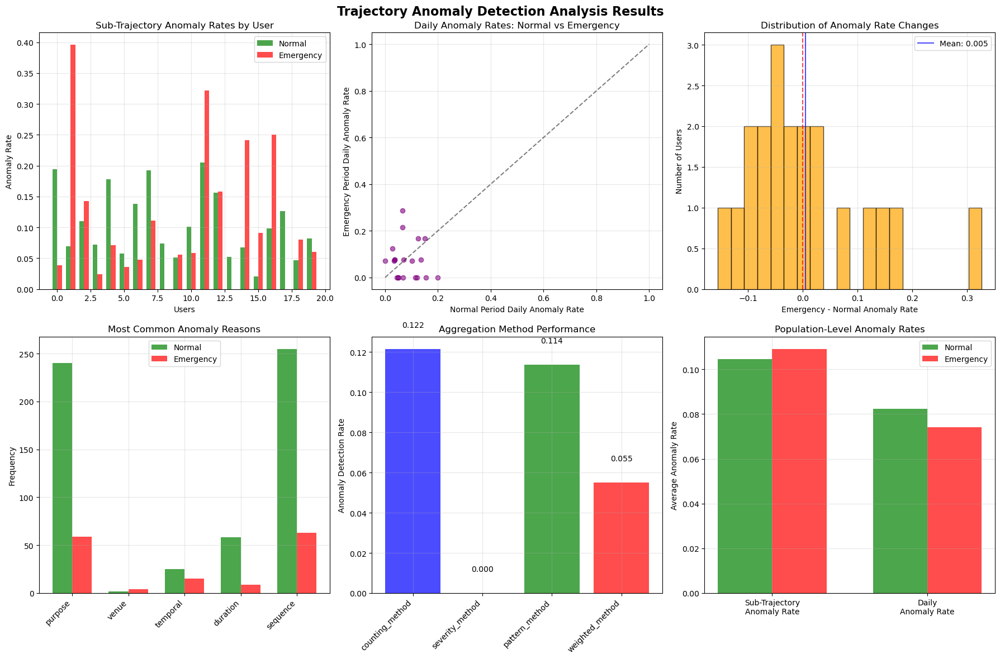

COMPREHENSIVE SUB-TRAJECTORY EXAMINATION

SUB-TRAJECTORY PATTERN ANALYSIS
Total Normal Sub-Trajectories: 2485
Total Emergency Sub-Trajectories: 583

🏢 VENUE PATTERN ANALYSIS:
Most Common Normal Sequences:
  food_service: 316
  other: 254
  retail_commercial: 162
  food_service → food_service: 115
  recreation: 73
  other → other: 73
  hospitality: 69
  food_service → food_service → food_service: 60
  entertainment: 59
  retail_commercial → retail_commercial: 49

Most Common Emergency Sequences:
  other: 85
  food_service: 72
  retail_commercial: 45
  hospitality: 21
  entertainment: 20
  food_service → food_service: 20
  recreation: 20
  other → other: 17
  services: 16
  food_service → other: 12

Sequence Diversity:
  Normal: 0.300
  Emergency: 0.328
  Change: +0.027

⏰ TEMPORAL PATTERN ANALYSIS:
Average Start Hour:
  Normal: 10.4
  Emergency: 11.3
  Change: +0.9 hours

Hour Distribution (Normal):
  00:00 - 270 trips
  01:00 - 48 trips
  02:00 - 37 trips
  03:00 - 50 trips
  04:00 - 7

In [18]:
# After running your trajectory analysis
results = run_complete_trajectory_analysis(normal_folder, emergency_folder, max_users=20)

# Now examine the sub-trajectories in detail
examine_all_subtrajectories(results)

In [19]:
# Look at a specific user in detail
quick_subtraj_overview(results, user_id=1)
quick_subtraj_overview(results, user_id=4)  # User 4 had 250 normal + 42 emergency trips

DETAILED SUB-TRAJECTORY ANALYSIS FOR USER 1
Normal Period: 98 sub-trajectories
Emergency Period: 26 sub-trajectories

📍 NORMAL PERIOD EXAMPLES (showing first 5):

--- NORMAL Sub-Trajectory 1 ---
ID: day_0_trip_0
Day: 0
Time: 00:30 - 01:00
Duration: 30.0 minutes
Sequence: Food → Food
Categories: food_service → food_service
Purpose: dining
Trip Length: 2 venues
Anomaly Score: 0.536 (ANOMALOUS)
  Venue Anomaly: 0.000
  Temporal Anomaly: 0.558
  Sequence Anomaly: 0.990
  Duration Anomaly: 0.326
  Purpose Anomaly: 0.806
  Anomaly Reasons: sequence, purpose
Original Sentences:
    1. At 00:30 on Monday early morning, the user visited Food in high-density urban area inner from city c...
    2. At 01:00 on Monday early morning, the user visited Food in high-density urban area inner from city c...

--- NORMAL Sub-Trajectory 2 ---
ID: day_0_trip_1
Day: 0
Time: 04:00 - 04:30
Duration: 30.0 minutes
Sequence: Bar → Bar
Categories: entertainment → entertainment
Purpose: entertainment
Trip Length: 2 

{'user_id': 4,
 'user_patterns': {'venue_patterns': {'common_venues': {'Bakery',
    'Bar',
    'Café',
    'Church',
    'Drug Store',
    'Elderly Care Home',
    'Food',
    'Grocery Store',
    'Karaoke',
    'No_POI',
    'Park',
    'Sweets'},
   'common_categories': {'entertainment',
    'food_service',
    'hospitality',
    'other',
    'recreation',
    'retail_commercial'},
   'venue_frequencies': {'Food': 572,
    'Real Estate': 1,
    'Park': 16,
    'Church': 2,
    'Sweets': 13,
    'Café': 138,
    'Bar': 18,
    'Bakery': 29,
    'No_POI': 7,
    'Elderly Care Home': 17,
    'Drug Store': 2,
    'Karaoke': 3,
    'Recycle Shop': 1,
    'School': 1,
    'Grocery Store': 2,
    'Pub': 1},
   'category_frequencies': {'food_service': 572,
    'other': 198,
    'recreation': 16,
    'hospitality': 13,
    'entertainment': 18,
    'retail_commercial': 5,
    'services': 1},
   'total_unique_venues': 16,
   'total_unique_categories': 7},
  'temporal_patterns': {'typical_start

In [20]:
# Find the most anomalous and interesting sub-trajectories
find_interesting_subtrajectories(results)


MOST INTERESTING SUB-TRAJECTORIES

🚨 HIGHEST ANOMALY SCORES:
1. User 6 (normal) - Score: 0.686
   Sequence: Park
   Reasons: venue, sequence, purpose
2. User 10 (normal) - Score: 0.684
   Sequence: Café → Café → Food → Bar
   Reasons: sequence, duration, purpose
3. User 19 (normal) - Score: 0.680
   Sequence: Bar
   Reasons: sequence, duration, purpose
4. User 10 (normal) - Score: 0.674
   Sequence: Clothes Store
   Reasons: venue, sequence, purpose
5. User 19 (normal) - Score: 0.664
   Sequence: Drug Store → Bar
   Reasons: sequence, duration, purpose

⏱️ LONGEST DURATION TRIPS:
1. User 2 (normal) - Duration: 1410.0 minutes
   Sequence: Drug Store → Drug Store → Drug Store → Drug Store → Drug Store → Park → Park → Drug Store → Drug Store → Drug Store → Drug Store → Drug Store
2. User 2 (normal) - Duration: 1410.0 minutes
   Sequence: Drug Store → Drug Store → Drug Store → Drug Store → Drug Store → Drug Store → Drug Store → Café → Park → Café → Drug Store → Drug Store → Drug Store
3. 